# BrainScan AI: End-to-End UREC1-Compliant ML Pipeline

**Project title:** BrainScan AI: Explainable Deep Learning for Alzheimer's Disease Stage Classification Using OASIS MRI Images

This notebook is written for the final dissertation/project implementation. It follows the submitted UREC1 scope:

- Uses only an existing public, de-identified Kaggle/OASIS MRI image dataset.
- No human participants, interviews, surveys, observations, new MRI scans, tissue or bodily fluids are collected.
- No subject names, contact details, raw clinical records or identifiable DICOM metadata are used.
- The work is an educational/research prototype only, **not** a clinical diagnostic tool.
- Dataset images are not redistributed. Only code, aggregate tables, figures, model weights and appropriate citations are shared.

The workflow covers dataset audit, EDA, image visualisation, data quality checks, preprocessing, train/validation/test splitting, class imbalance handling, model comparison, final testing metrics, Grad-CAM explainability and Hugging Face Spaces export.

In [1]:
# Optional installation if a Kaggle environment is missing something.
# !pip install -q seaborn scikit-learn pillow opencv-python

## 1. Imports, reproducibility and configuration

In [2]:
import os, re, json, math, random, shutil, hashlib, warnings
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
from PIL import Image, ImageOps

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_recall_fscore_support,
    classification_report, confusion_matrix, roc_auc_score, roc_curve, auc,
    precision_recall_curve, average_precision_score, cohen_kappa_score
)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, CSVLogger

warnings.filterwarnings('ignore')
SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

sns.set_theme(style='whitegrid', context='notebook', palette='viridis')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 220

print('TensorFlow:', tf.__version__)
print('GPU devices:', tf.config.list_physical_devices('GPU'))

TensorFlow: 2.20.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [3]:
# Main settings. For final report results, keep RUN_FAST = False.
RUN_FAST = False
SPLIT_MODE = 'image'      # 'image' for Kaggle benchmark; 'patient' for stricter leakage control if feasible
IMG_SIZE = 160
BATCH_SIZE = 32
TEST_SIZE = 0.15
VAL_SIZE_FROM_TRAINVAL = 0.15

BALANCE_TRAINING = True
TARGET_TRAIN_PER_CLASS = 5000 if not RUN_FAST else 300
EDA_SAMPLE_PER_CLASS = 1500 if not RUN_FAST else 80
AVERAGE_IMAGE_SAMPLE_PER_CLASS = 400 if not RUN_FAST else 40
DUPLICATE_AUDIT_LIMIT = 25000 if not RUN_FAST else 1500

EPOCHS_HEAD = 10 if not RUN_FAST else 2
EPOCHS_FINE = 8 if not RUN_FAST else 1
HEAD_LR = 1e-3
FINE_LR = 1e-5
AUTOTUNE = tf.data.AUTOTUNE

OUTPUT_DIR = Path('/kaggle/working/brainscan_ai_outputs') if Path('/kaggle/working').exists() else Path('brainscan_ai_outputs')
FIG_DIR = OUTPUT_DIR / 'figures'
TABLE_DIR = OUTPUT_DIR / 'tables'
MODEL_DIR = OUTPUT_DIR / 'models'
HF_DIR = OUTPUT_DIR / 'huggingface_space'
for d in [OUTPUT_DIR, FIG_DIR, TABLE_DIR, MODEL_DIR, HF_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print('Output folder:', OUTPUT_DIR.resolve())
print('RUN_FAST:', RUN_FAST, '| SPLIT_MODE:', SPLIT_MODE)

Output folder: /kaggle/working/brainscan_ai_outputs
RUN_FAST: False | SPLIT_MODE: image


## 2. UREC1 compliance checklist

In [4]:
urec1_checklist = pd.DataFrame([
    ['Human participants', 'No', 'No recruitment, interviews, surveys or observations.'],
    ['New medical data collection', 'No', 'Only existing secondary Kaggle/OASIS MRI images.'],
    ['Identifiable data', 'No', 'No names, contact details, clinical records or identifiable DICOM metadata.'],
    ['Tissue or bodily fluids', 'No', 'Not applicable.'],
    ['External organisation access', 'No', 'No hospital/clinic/company collaboration required.'],
    ['Dataset redistribution', 'No', 'Do not redistribute MRI images; share code/results only.'],
    ['Clinical diagnosis claim', 'No', 'Educational research prototype only.'],
    ['Explainability', 'Yes', 'Grad-CAM heatmaps for model inspection.']
], columns=['UREC1 area', 'Project position', 'Implementation note'])

display(urec1_checklist)
urec1_checklist.to_csv(TABLE_DIR / '00_urec1_compliance_checklist.csv', index=False)

,UREC1 area,Project position,Implementation note
0,Human participants,No,"No recruitment, interviews, surveys or observa..."
1,New medical data collection,No,Only existing secondary Kaggle/OASIS MRI images.
2,Identifiable data,No,"No names, contact details, clinical records or..."
3,Tissue or bodily fluids,No,Not applicable.
4,External organisation access,No,No hospital/clinic/company collaboration requi...
5,Dataset redistribution,No,Do not redistribute MRI images; share code/res...
6,Clinical diagnosis claim,No,Educational research prototype only.
7,Explainability,Yes,Grad-CAM heatmaps for model inspection.


## 3. Dataset discovery and metadata creation

Dataset used in this project: Kaggle/OASIS Alzheimer's MRI image dataset. It is derived from OASIS-1 MRI data and contains 2D JPG slices arranged into four Alzheimer's progression classes.

Expected Kaggle path after adding dataset: `/kaggle/input/imagesoasis/Data`

In [5]:
CLASS_ORDER = ['Non Demented', 'Very mild Dementia', 'Mild Dementia', 'Moderate Dementia']
CLASS_PRETTY = {
    'Non Demented': 'Non-Demented',
    'Very mild Dementia': 'Very Mild Demented',
    'Mild Dementia': 'Mild Demented',
    'Moderate Dementia': 'Moderate Demented'
}
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_ORDER)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}
IDX_TO_PRETTY = {i: CLASS_PRETTY[c] for c, i in CLASS_TO_IDX.items()}


def find_dataset_root():
    candidates = [
        Path('/kaggle/input/imagesoasis/Data'),
        Path('/kaggle/input/oasis-alzheimers-detection/Data'),
        Path('/kaggle/input/oasis-alzheimer-s-detection/Data'),
        Path('/kaggle/input')
    ]
    for cand in candidates:
        if cand.exists() and all((cand / c).exists() for c in CLASS_ORDER):
            return cand
        if cand.exists():
            for root, dirs, files in os.walk(cand):
                root = Path(root)
                if all((root / c).exists() for c in CLASS_ORDER):
                    return root
    raise FileNotFoundError('Dataset not found. Add Kaggle dataset: ninadaithal/imagesoasis')

DATA_ROOT = find_dataset_root()
print('Dataset root:', DATA_ROOT)

Dataset root: /kaggle/input/datasets/ninadaithal/imagesoasis/Data


In [6]:
pattern = re.compile(r'OAS1[_-](?P<patient>\d+)[_-]MR(?P<mr>\d+)[_-]mpr[-_](?P<mpr>\d+)[_-](?P<slice>\d+)\.(jpg|jpeg|png)$', re.I)

def parse_filename(path):
    m = pattern.match(Path(path).name)
    if m:
        return int(m.group('patient')), int(m.group('mr')), int(m.group('mpr')), int(m.group('slice')), 'parsed'
    return -1, -1, -1, -1, 'not_parsed'

rows = []
for class_name in CLASS_ORDER:
    for path in sorted((DATA_ROOT / class_name).rglob('*')):
        if path.suffix.lower() in ['.jpg', '.jpeg', '.png']:
            patient_id, mr_id, mpr_id, slice_id, parse_status = parse_filename(path)
            rows.append({
                'path': str(path),
                'filename': path.name,
                'class_name': class_name,
                'class_pretty': CLASS_PRETTY[class_name],
                'label_idx': CLASS_TO_IDX[class_name],
                'patient_id': patient_id,
                'mr_id': mr_id,
                'mpr_id': mpr_id,
                'slice_id': slice_id,
                'parse_status': parse_status,
                'patient_session': f'{patient_id}_MR{mr_id}' if patient_id >= 0 else 'unknown'
            })

meta_df = pd.DataFrame(rows)
if meta_df.empty:
    raise ValueError('No images found in dataset folders.')

meta_df.to_csv(TABLE_DIR / '01_metadata.csv', index=False)
print('Total images:', len(meta_df))
display(meta_df.head())
display(meta_df['class_pretty'].value_counts().reindex([CLASS_PRETTY[c] for c in CLASS_ORDER]))
display(meta_df['parse_status'].value_counts())

Total images: 86437


,path,filename,class_name,class_pretty,label_idx,patient_id,mr_id,mpr_id,slice_id,parse_status,patient_session
0,/kaggle/input/datasets/ninadaithal/imagesoasis...,OAS1_0001_MR1_mpr-1_100.jpg,Non Demented,Non-Demented,0,1,1,1,100,parsed,1_MR1
1,/kaggle/input/datasets/ninadaithal/imagesoasis...,OAS1_0001_MR1_mpr-1_101.jpg,Non Demented,Non-Demented,0,1,1,1,101,parsed,1_MR1
2,/kaggle/input/datasets/ninadaithal/imagesoasis...,OAS1_0001_MR1_mpr-1_102.jpg,Non Demented,Non-Demented,0,1,1,1,102,parsed,1_MR1
3,/kaggle/input/datasets/ninadaithal/imagesoasis...,OAS1_0001_MR1_mpr-1_103.jpg,Non Demented,Non-Demented,0,1,1,1,103,parsed,1_MR1
4,/kaggle/input/datasets/ninadaithal/imagesoasis...,OAS1_0001_MR1_mpr-1_104.jpg,Non Demented,Non-Demented,0,1,1,1,104,parsed,1_MR1


class_pretty
Non-Demented          67222
Very Mild Demented    13725
Mild Demented          5002
Moderate Demented       488
Name: count, dtype: int64

parse_status
parsed    86437
Name: count, dtype: int64

## 4. Dataset overview and class imbalance visualisations

,class_name,class_pretty,label_idx,count,percentage
2,Non Demented,Non-Demented,0,67222,77.769936
3,Very mild Dementia,Very Mild Demented,1,13725,15.878617
0,Mild Dementia,Mild Demented,2,5002,5.786874
1,Moderate Dementia,Moderate Demented,3,488,0.564573


Saved: /kaggle/working/brainscan_ai_outputs/figures/01_class_count_bar.png


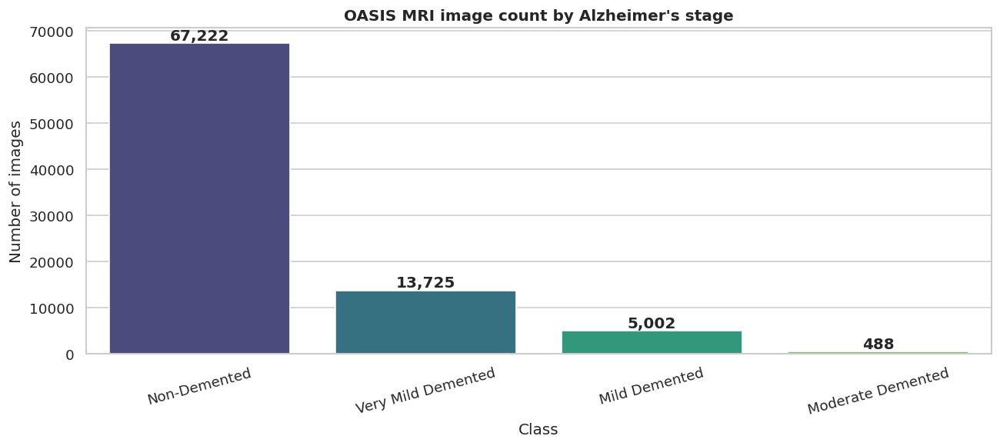

Saved: /kaggle/working/brainscan_ai_outputs/figures/02_class_share_donut.png


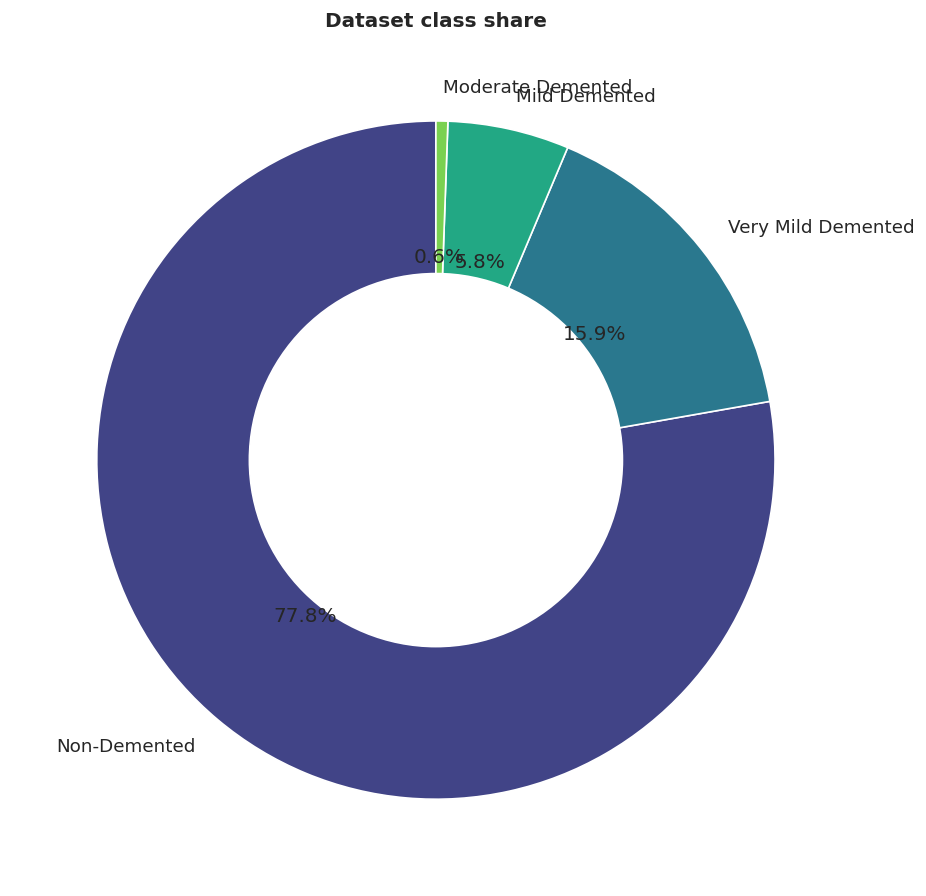

Saved: /kaggle/working/brainscan_ai_outputs/figures/03_class_count_log.png


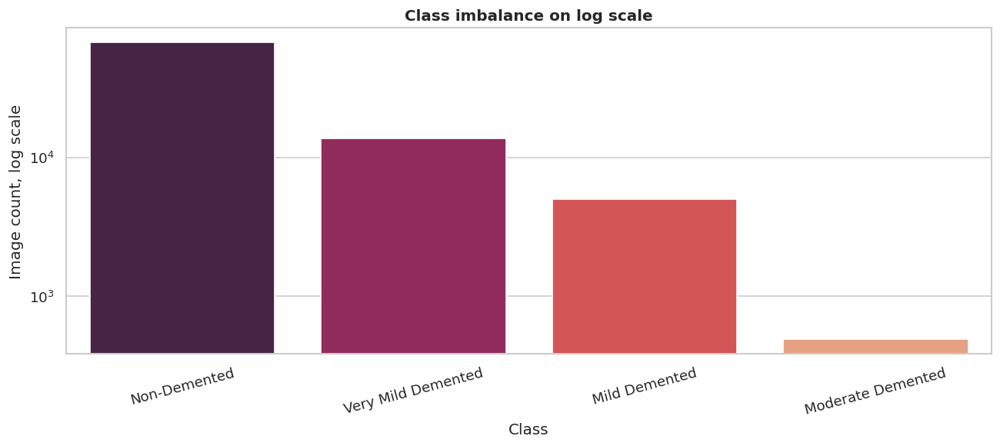

In [7]:
def savefig(name):
    plt.tight_layout()
    path = FIG_DIR / name
    plt.savefig(path, bbox_inches='tight')
    print('Saved:', path)

class_counts = meta_df.groupby(['class_name', 'class_pretty', 'label_idx']).size().reset_index(name='count').sort_values('label_idx')
class_counts['percentage'] = 100 * class_counts['count'] / class_counts['count'].sum()
class_counts.to_csv(TABLE_DIR / '02_class_counts.csv', index=False)

display(class_counts)

fig, ax = plt.subplots(figsize=(11, 5))
sns.barplot(data=class_counts, x='class_pretty', y='count', hue='class_pretty', palette='viridis', legend=False, ax=ax)
ax.set_title('OASIS MRI image count by Alzheimer\'s stage', fontweight='bold')
ax.set_xlabel('Class'); ax.set_ylabel('Number of images')
ax.tick_params(axis='x', rotation=15)
for p in ax.patches:
    ax.annotate(f'{int(p.get_height()):,}', (p.get_x()+p.get_width()/2, p.get_height()), ha='center', va='bottom', fontweight='bold')
savefig('01_class_count_bar.png')
plt.show()

fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(class_counts['count'], labels=class_counts['class_pretty'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', 4))
ax.add_artist(plt.Circle((0,0), 0.55, fc='white'))
ax.set_title('Dataset class share', fontweight='bold')
savefig('02_class_share_donut.png')
plt.show()

fig, ax = plt.subplots(figsize=(11, 5))
sns.barplot(data=class_counts, x='class_pretty', y='count', hue='class_pretty', palette='rocket', legend=False, ax=ax)
ax.set_yscale('log')
ax.set_title('Class imbalance on log scale', fontweight='bold')
ax.set_xlabel('Class'); ax.set_ylabel('Image count, log scale')
ax.tick_params(axis='x', rotation=15)
savefig('03_class_count_log.png')
plt.show()

,class_pretty,images,unique_patients,sessions,min_slice,max_slice
0,Non-Demented,67222,266,285,100,160
1,Very Mild Demented,13725,58,58,100,160
2,Mild Demented,5002,21,21,100,160
3,Moderate Demented,488,2,2,100,160


Saved: /kaggle/working/brainscan_ai_outputs/figures/04_images_patients_sessions.png


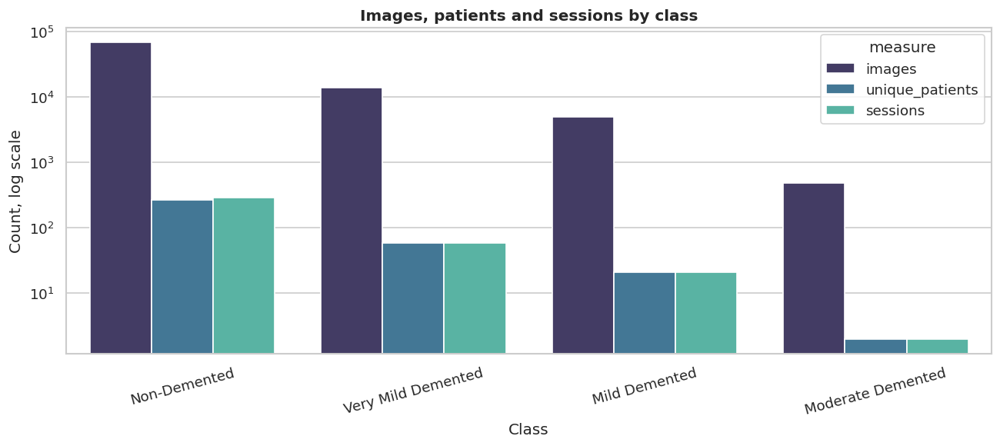

In [8]:
patient_summary = meta_df.groupby('class_pretty').agg(
    images=('path','count'),
    unique_patients=('patient_id', lambda s: s[s>=0].nunique()),
    sessions=('patient_session','nunique'),
    min_slice=('slice_id','min'),
    max_slice=('slice_id','max')
).reindex([CLASS_PRETTY[c] for c in CLASS_ORDER]).reset_index()
patient_summary.to_csv(TABLE_DIR / '03_patient_summary.csv', index=False)
display(patient_summary)

fig, ax = plt.subplots(figsize=(11, 5))
long = patient_summary.melt(id_vars='class_pretty', value_vars=['images','unique_patients','sessions'], var_name='measure', value_name='count')
sns.barplot(data=long, x='class_pretty', y='count', hue='measure', palette='mako', ax=ax)
ax.set_yscale('log')
ax.set_title('Images, patients and sessions by class', fontweight='bold')
ax.tick_params(axis='x', rotation=15)
ax.set_xlabel('Class'); ax.set_ylabel('Count, log scale')
savefig('04_images_patients_sessions.png')
plt.show()

Saved: /kaggle/working/brainscan_ai_outputs/figures/05_slice_distribution.png


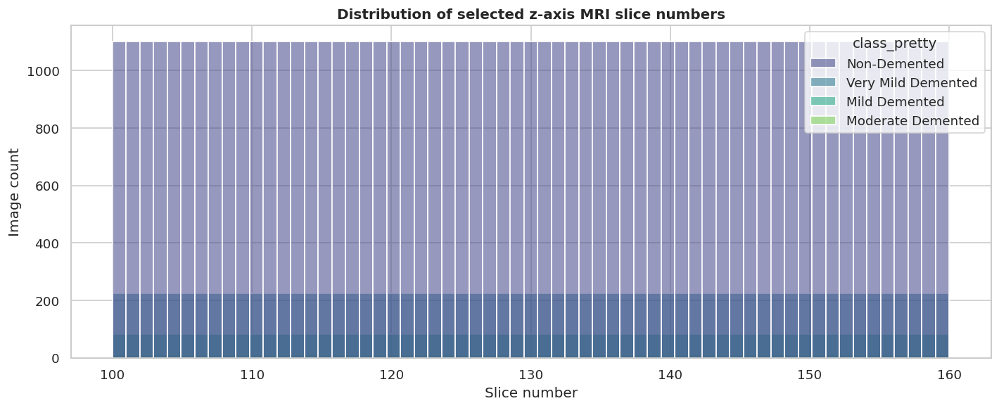

In [9]:
if (meta_df['slice_id'] >= 0).any():
    fig, ax = plt.subplots(figsize=(12, 5))
    sns.histplot(data=meta_df[meta_df['slice_id']>=0], x='slice_id', hue='class_pretty', bins=61, multiple='layer', alpha=.55, palette='viridis', ax=ax)
    ax.set_title('Distribution of selected z-axis MRI slice numbers', fontweight='bold')
    ax.set_xlabel('Slice number'); ax.set_ylabel('Image count')
    savefig('05_slice_distribution.png')
    plt.show()

## 5. MRI image visualisation

Saved: /kaggle/working/brainscan_ai_outputs/figures/06_random_mri_gallery.png


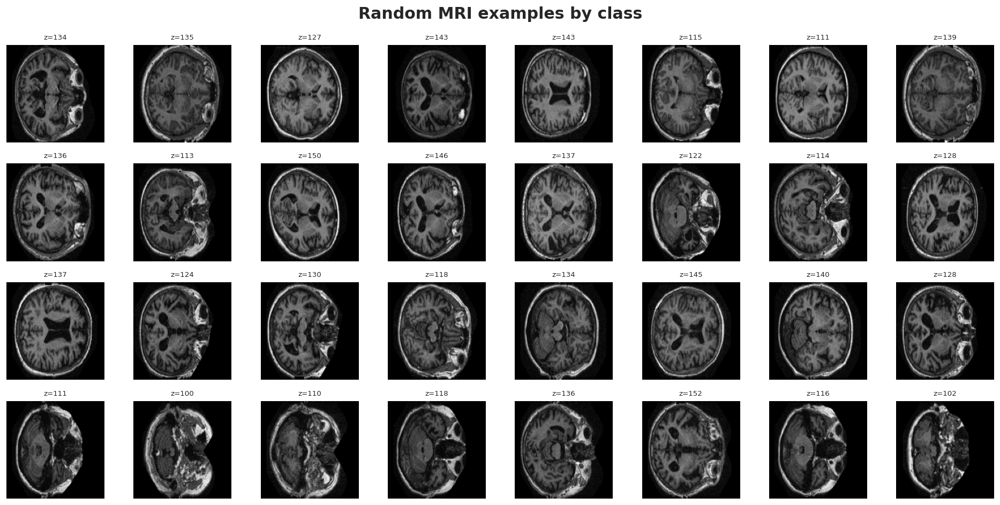

In [10]:
def load_pil(path, size=None, mode='L'):
    img = Image.open(path)
    img = ImageOps.exif_transpose(img)
    if mode: img = img.convert(mode)
    if size: img = img.resize((size, size))
    return img

fig, axes = plt.subplots(len(CLASS_ORDER), 8, figsize=(16, 8))
for r, class_name in enumerate(CLASS_ORDER):
    sample = meta_df[meta_df['class_name']==class_name].sample(min(8, sum(meta_df['class_name']==class_name)), random_state=SEED)
    for c in range(8):
        axes[r, c].axis('off')
        if c < len(sample):
            row = sample.iloc[c]
            axes[r, c].imshow(load_pil(row['path'], IMG_SIZE, 'L'), cmap='gray')
            axes[r, c].set_title(f"z={row['slice_id']}", fontsize=8)
            if c == 0: axes[r, c].set_ylabel(CLASS_PRETTY[class_name], fontweight='bold')
fig.suptitle('Random MRI examples by class', fontsize=18, fontweight='bold')
savefig('06_random_mri_gallery.png')
plt.show()

Saved: /kaggle/working/brainscan_ai_outputs/figures/07_z_axis_progression.png


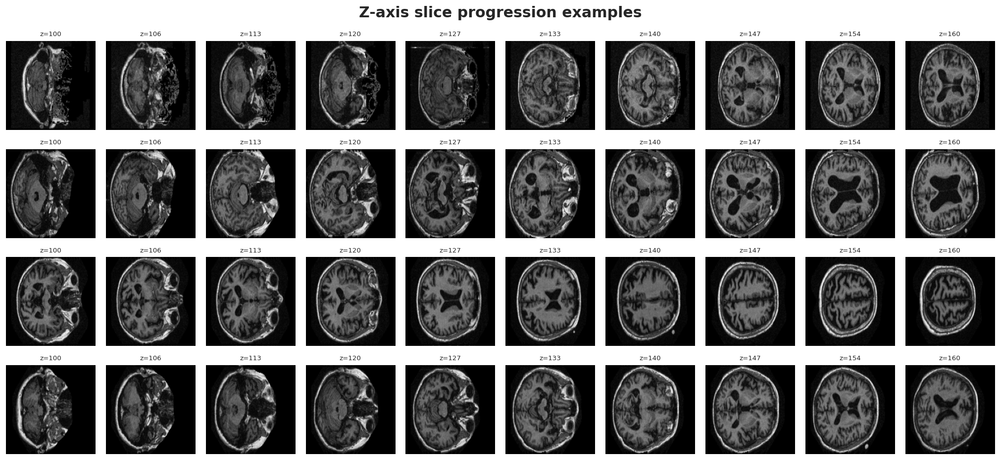

In [11]:
parsed = meta_df[(meta_df['patient_id']>=0) & (meta_df['slice_id']>=0)].copy()
if not parsed.empty:
    fig, axes = plt.subplots(len(CLASS_ORDER), 10, figsize=(17, 8))
    for r, class_name in enumerate(CLASS_ORDER):
        sub = parsed[parsed['class_name']==class_name]
        for c in range(10): axes[r, c].axis('off')
        if sub.empty: continue
        session = sub.groupby('patient_session').size().sort_values(ascending=False).index[0]
        seq = sub[sub['patient_session']==session].sort_values('slice_id')
        seq = seq.iloc[np.linspace(0, len(seq)-1, min(10, len(seq))).astype(int)]
        for c, (_, row) in enumerate(seq.iterrows()):
            axes[r, c].imshow(load_pil(row['path'], IMG_SIZE, 'L'), cmap='gray')
            axes[r, c].set_title(f"z={row['slice_id']}", fontsize=8)
            if c == 0: axes[r, c].set_ylabel(CLASS_PRETTY[class_name], fontweight='bold')
    fig.suptitle('Z-axis slice progression examples', fontsize=18, fontweight='bold')
    savefig('07_z_axis_progression.png')
    plt.show()

## 6. Image statistics EDA

In [12]:
def stratified_sample(df, n_per_class):
    return pd.concat([df[df['class_name']==c].sample(min(n_per_class, sum(df['class_name']==c)), random_state=SEED) for c in CLASS_ORDER]).reset_index(drop=True)

eda_df = stratified_sample(meta_df, EDA_SAMPLE_PER_CLASS)
print('EDA sample size:', len(eda_df))

def entropy(arr):
    h, _ = np.histogram(arr.flatten(), bins=256, range=(0,255), density=True)
    h = h[h>0]
    return float(-(h*np.log2(h)).sum())

def edge_score(arr):
    arr = arr.astype('float32')
    return float((np.abs(np.diff(arr, axis=0)).mean() + np.abs(np.diff(arr, axis=1)).mean())/2)

stat_rows = []
for _, row in eda_df.iterrows():
    arr = np.array(load_pil(row['path'], IMG_SIZE, 'L')).astype('float32')
    stat_rows.append({**row.to_dict(),
        'mean_intensity': arr.mean(), 'std_intensity': arr.std(),
        'p05': np.percentile(arr,5), 'p50': np.percentile(arr,50), 'p95': np.percentile(arr,95),
        'entropy': entropy(arr), 'edge_score': edge_score(arr), 'non_black_ratio': (arr>10).mean()
    })
stats_df = pd.DataFrame(stat_rows)
stats_df.to_csv(TABLE_DIR / '04_image_statistics.csv', index=False)
display(stats_df.groupby('class_pretty')[['mean_intensity','std_intensity','entropy','edge_score','non_black_ratio']].agg(['mean','std']).round(3))

EDA sample size: 4988


mean_intensity        std_intensity        entropy         \
                             mean    std          mean    std    mean    std   
class_pretty                                                                   
Mild Demented           40.243999  4.010     44.363998  2.878   5.861  0.337   
Moderate Demented       39.905998  4.239     44.759998  2.914   5.856  0.371   
Non-Demented            42.568001  6.882     44.525002  4.289   5.820  0.420   
Very Mild Demented      39.974998  5.535     44.199001  3.100   5.721  0.484   

                   edge_score        non_black_ratio         
                         mean    std            mean    std  
class_pretty                                                 
Mild Demented           8.067  0.612           0.614  0.047  
Moderate Demented       8.149  0.726           0.620  0.058  
Non-Demented            7.686  0.787           0.612  0.067  
Very Mild Demented      7.820  0.839           0.599  0.076

Saved: /kaggle/working/brainscan_ai_outputs/figures/08_violin_mean_intensity.png


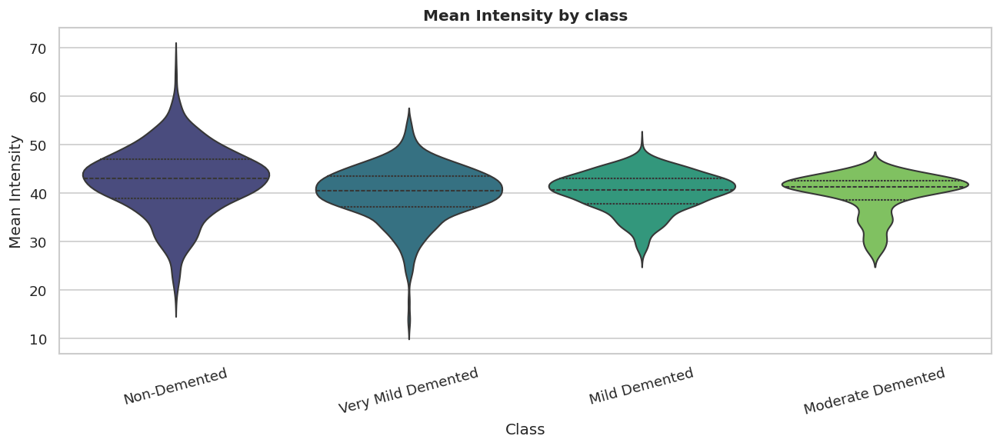

Saved: /kaggle/working/brainscan_ai_outputs/figures/08_violin_std_intensity.png


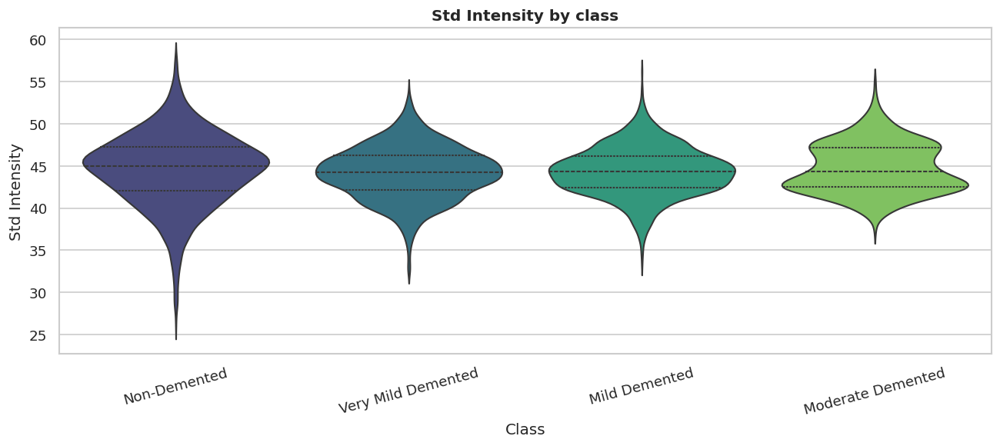

Saved: /kaggle/working/brainscan_ai_outputs/figures/08_violin_entropy.png


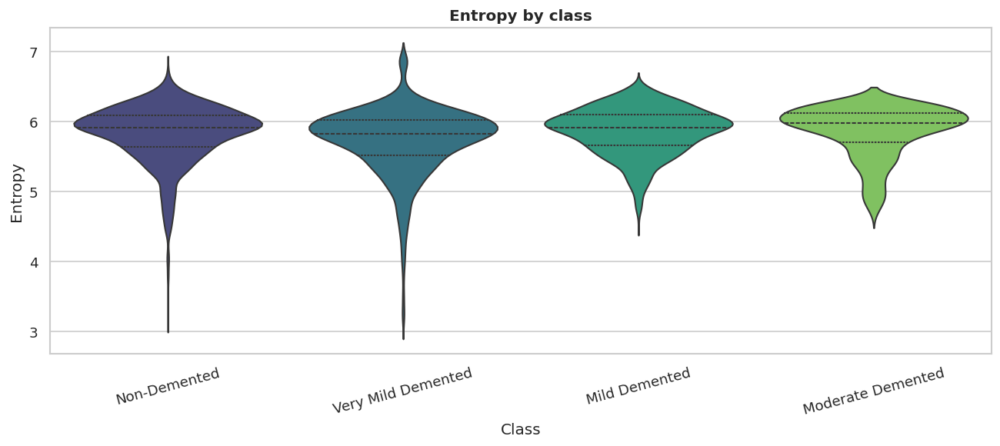

Saved: /kaggle/working/brainscan_ai_outputs/figures/08_violin_edge_score.png


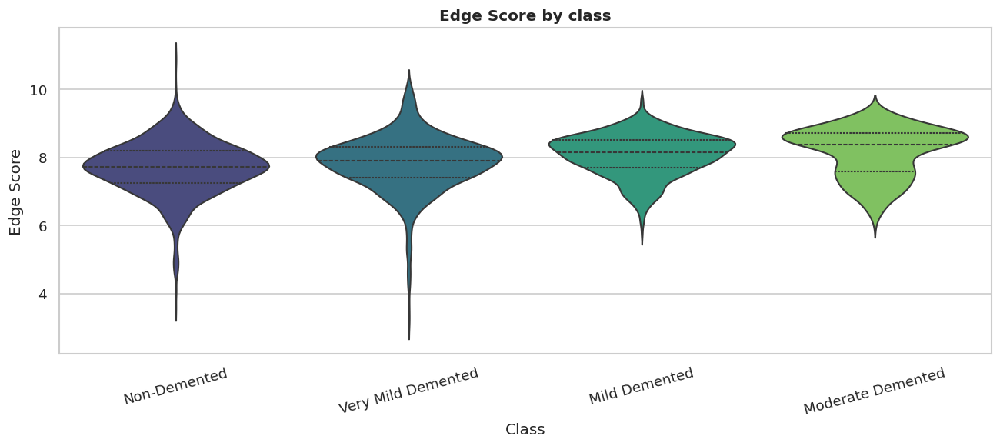

Saved: /kaggle/working/brainscan_ai_outputs/figures/08_violin_non_black_ratio.png


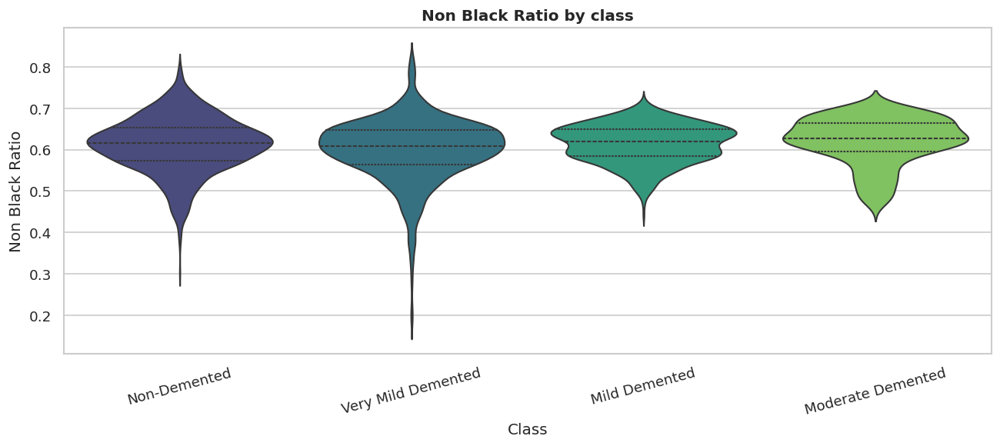

Saved: /kaggle/working/brainscan_ai_outputs/figures/09_mean_vs_std_scatter.png


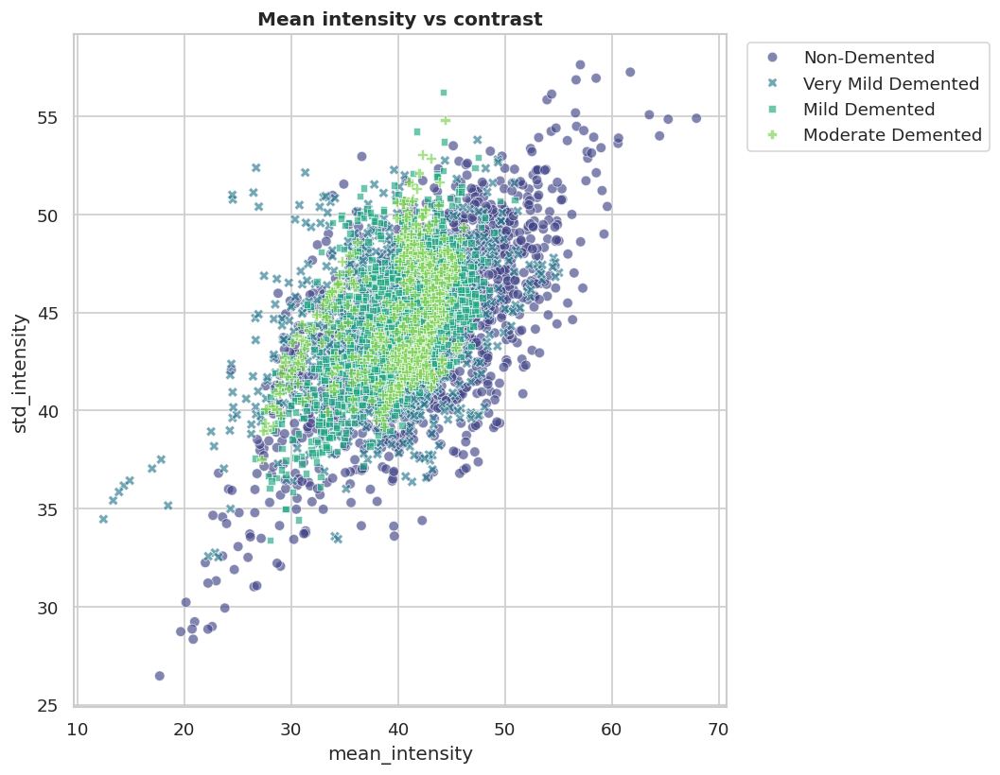

Saved: /kaggle/working/brainscan_ai_outputs/figures/10_statistics_correlation.png


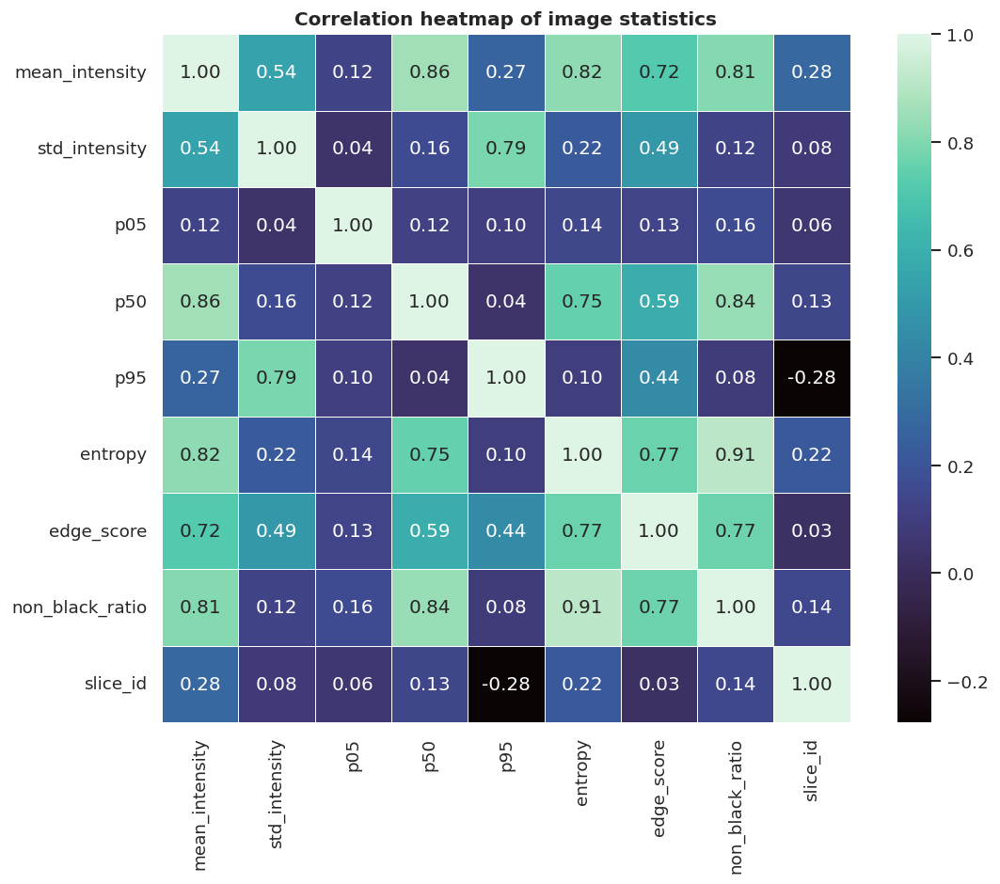

In [13]:
for col in ['mean_intensity','std_intensity','entropy','edge_score','non_black_ratio']:
    fig, ax = plt.subplots(figsize=(11, 5))
    sns.violinplot(data=stats_df, x='class_pretty', y=col, hue='class_pretty', palette='viridis', inner='quartile', legend=False, ax=ax)
    ax.set_title(f'{col.replace("_", " ").title()} by class', fontweight='bold')
    ax.set_xlabel('Class'); ax.set_ylabel(col.replace('_',' ').title())
    ax.tick_params(axis='x', rotation=15)
    savefig(f'08_violin_{col}.png')
    plt.show()

fig, ax = plt.subplots(figsize=(9, 7))
sns.scatterplot(data=stats_df, x='mean_intensity', y='std_intensity', hue='class_pretty', style='class_pretty', alpha=.65, s=40, palette='viridis', ax=ax)
ax.set_title('Mean intensity vs contrast', fontweight='bold')
ax.legend(bbox_to_anchor=(1.02,1), loc='upper left')
savefig('09_mean_vs_std_scatter.png')
plt.show()

fig, ax = plt.subplots(figsize=(10, 8))
corr = stats_df[['mean_intensity','std_intensity','p05','p50','p95','entropy','edge_score','non_black_ratio','slice_id']].corr(numeric_only=True)
sns.heatmap(corr, annot=True, fmt='.2f', cmap='mako', square=True, linewidths=.4, ax=ax)
ax.set_title('Correlation heatmap of image statistics', fontweight='bold')
savefig('10_statistics_correlation.png')
plt.show()

Saved: /kaggle/working/brainscan_ai_outputs/figures/11_average_and_variability.png


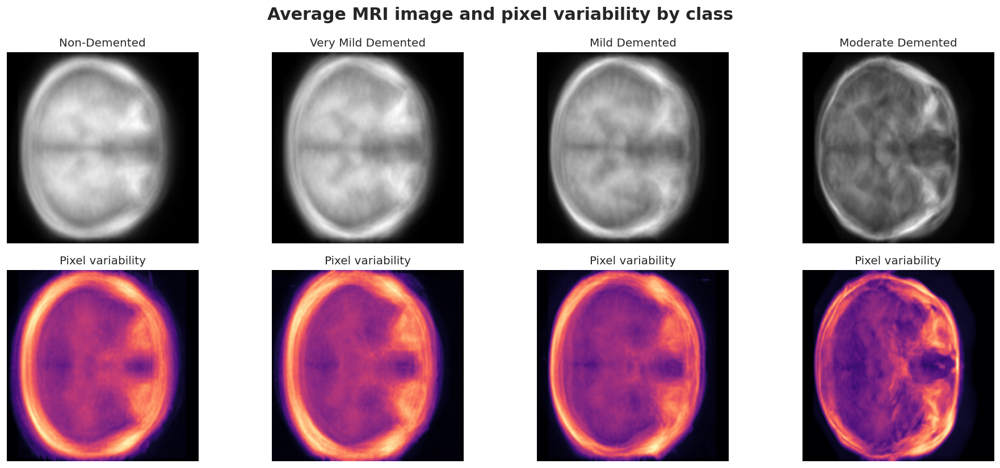

Saved: /kaggle/working/brainscan_ai_outputs/figures/12_horizontal_profile.png


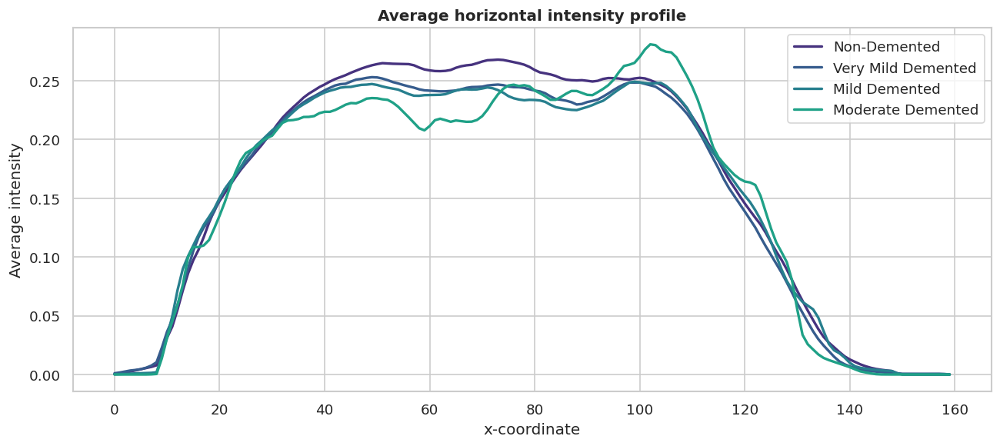

In [14]:
avg_images, std_images = {}, {}
for class_name in CLASS_ORDER:
    sample = meta_df[meta_df['class_name']==class_name].sample(min(AVERAGE_IMAGE_SAMPLE_PER_CLASS, sum(meta_df['class_name']==class_name)), random_state=SEED)
    stack = [np.array(load_pil(p, IMG_SIZE, 'L')).astype('float32')/255 for p in sample['path']]
    stack = np.stack(stack)
    avg_images[class_name] = stack.mean(0)
    std_images[class_name] = stack.std(0)

fig, axes = plt.subplots(2, len(CLASS_ORDER), figsize=(16, 7))
for i, class_name in enumerate(CLASS_ORDER):
    axes[0,i].imshow(avg_images[class_name], cmap='gray'); axes[0,i].axis('off'); axes[0,i].set_title(CLASS_PRETTY[class_name])
    axes[1,i].imshow(std_images[class_name], cmap='magma'); axes[1,i].axis('off'); axes[1,i].set_title('Pixel variability')
fig.suptitle('Average MRI image and pixel variability by class', fontsize=18, fontweight='bold')
savefig('11_average_and_variability.png')
plt.show()

fig, ax = plt.subplots(figsize=(11,5))
for class_name in CLASS_ORDER:
    ax.plot(avg_images[class_name].mean(axis=0), label=CLASS_PRETTY[class_name], linewidth=2)
ax.set_title('Average horizontal intensity profile', fontweight='bold')
ax.set_xlabel('x-coordinate'); ax.set_ylabel('Average intensity'); ax.legend()
savefig('12_horizontal_profile.png')
plt.show()

## 7. Duplicate and leakage audit

,audit,count_in_sample,sample_size
0,Exact MD5 duplicates,0,25000
1,Average-hash similarity flags,19019,25000


Saved: /kaggle/working/brainscan_ai_outputs/figures/13_duplicate_audit.png


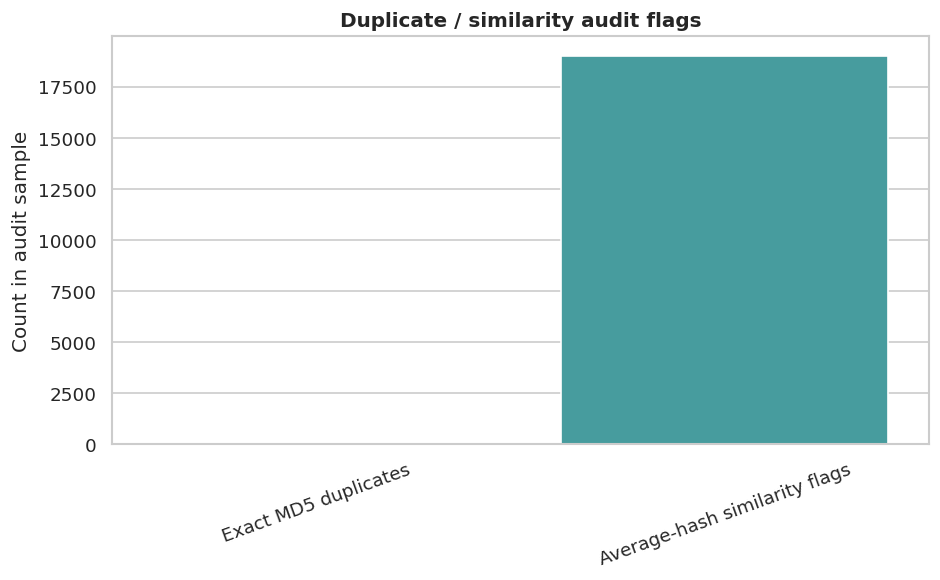

In [15]:
def md5_file(path):
    with open(path, 'rb') as f: return hashlib.md5(f.read()).hexdigest()

def average_hash(path, hash_size=8):
    arr = np.array(load_pil(path, hash_size, 'L'))
    return ''.join('1' if x else '0' for x in (arr > arr.mean()).flatten())

audit = meta_df.sample(min(DUPLICATE_AUDIT_LIMIT, len(meta_df)), random_state=SEED).copy()
audit['md5'] = [md5_file(p) for p in audit['path']]
audit['avg_hash'] = [average_hash(p) for p in audit['path']]
dup_report = pd.DataFrame({
    'audit': ['Exact MD5 duplicates', 'Average-hash similarity flags'],
    'count_in_sample': [audit.duplicated('md5').sum(), audit.duplicated('avg_hash').sum()],
    'sample_size': [len(audit), len(audit)]
})
dup_report.to_csv(TABLE_DIR / '05_duplicate_audit.csv', index=False)
display(dup_report)

fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(data=dup_report, x='audit', y='count_in_sample', hue='audit', palette='mako', legend=False, ax=ax)
ax.set_title('Duplicate / similarity audit flags', fontweight='bold')
ax.set_xlabel(''); ax.set_ylabel('Count in audit sample'); ax.tick_params(axis='x', rotation=20)
savefig('13_duplicate_audit.png')
plt.show()

## 8. Train, validation and test split

In [16]:
def image_split(df):
    trainval, test = train_test_split(df, test_size=TEST_SIZE, stratify=df['label_idx'], random_state=SEED)
    train, val = train_test_split(trainval, test_size=VAL_SIZE_FROM_TRAINVAL, stratify=trainval['label_idx'], random_state=SEED)
    return train.reset_index(drop=True), val.reset_index(drop=True), test.reset_index(drop=True)

def patient_split(df):
    try:
        from sklearn.model_selection import StratifiedGroupKFold
        valid = df[df['patient_id']>=0].copy()
        X, y, groups = valid['path'].values, valid['label_idx'].values, valid['patient_id'].values
        sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
        trainval_idx, test_idx = next(sgkf.split(X, y, groups))
        trainval, test = valid.iloc[trainval_idx], valid.iloc[test_idx]
        sgkf2 = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
        X2, y2, g2 = trainval['path'].values, trainval['label_idx'].values, trainval['patient_id'].values
        train_idx, val_idx = next(sgkf2.split(X2, y2, g2))
        train, val = trainval.iloc[train_idx], trainval.iloc[val_idx]
        if min(train['label_idx'].nunique(), val['label_idx'].nunique(), test['label_idx'].nunique()) < 4:
            raise ValueError('A class disappeared from a patient-level split.')
        return train.reset_index(drop=True), val.reset_index(drop=True), test.reset_index(drop=True)
    except Exception as e:
        print('Patient split not feasible:', e)
        print('Falling back to image-level split. Discuss patient/slice leakage as a limitation.')
        return image_split(df)

train_df, val_df, test_df = patient_split(meta_df) if SPLIT_MODE == 'patient' else image_split(meta_df)

for name, part in [('train', train_df), ('validation', val_df), ('test', test_df)]:
    part.to_csv(TABLE_DIR / f'06_{name}_split.csv', index=False)
    print(name, len(part))
    display(part['class_pretty'].value_counts().reindex([CLASS_PRETTY[c] for c in CLASS_ORDER]))

train 62450


class_pretty
Non-Demented          48567
Very Mild Demented     9916
Mild Demented          3614
Moderate Demented       353
Name: count, dtype: int64

validation 11021


class_pretty
Non-Demented          8571
Very Mild Demented    1750
Mild Demented          638
Moderate Demented       62
Name: count, dtype: int64

test 12966


class_pretty
Non-Demented          10084
Very Mild Demented     2059
Mild Demented           750
Moderate Demented        73
Name: count, dtype: int64

Saved: /kaggle/working/brainscan_ai_outputs/figures/14_split_distribution.png


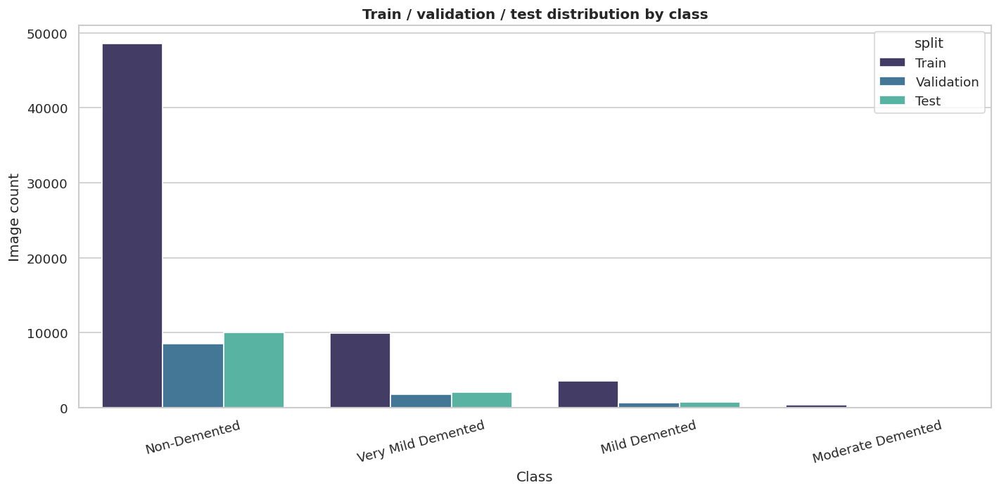

,comparison,overlap_patients
0,Train vs validation,347
1,Train vs test,347
2,Validation vs test,347


In [17]:
split_counts = []
for split, part in [('Train', train_df), ('Validation', val_df), ('Test', test_df)]:
    counts = part['class_pretty'].value_counts()
    for class_name in [CLASS_PRETTY[c] for c in CLASS_ORDER]:
        split_counts.append({'split': split, 'class': class_name, 'count': counts.get(class_name, 0)})
split_counts = pd.DataFrame(split_counts)
split_counts.to_csv(TABLE_DIR / '07_split_counts.csv', index=False)

fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(data=split_counts, x='class', y='count', hue='split', palette='mako', ax=ax)
ax.set_title('Train / validation / test distribution by class', fontweight='bold')
ax.set_xlabel('Class'); ax.set_ylabel('Image count'); ax.tick_params(axis='x', rotation=15)
savefig('14_split_distribution.png')
plt.show()

def pset(df): return set(df.loc[df['patient_id']>=0, 'patient_id'].unique())
overlap_report = pd.DataFrame({
    'comparison': ['Train vs validation', 'Train vs test', 'Validation vs test'],
    'overlap_patients': [len(pset(train_df)&pset(val_df)), len(pset(train_df)&pset(test_df)), len(pset(val_df)&pset(test_df))]
})
display(overlap_report)
overlap_report.to_csv(TABLE_DIR / '08_patient_overlap_report.csv', index=False)

## 9. Balance only the training set

,class,before,after,method
0,Non-Demented,48567,5000,undersample
1,Very Mild Demented,9916,5000,undersample
2,Mild Demented,3614,5000,oversample
3,Moderate Demented,353,5000,oversample


Saved: /kaggle/working/brainscan_ai_outputs/figures/15_balanced_training_set.png


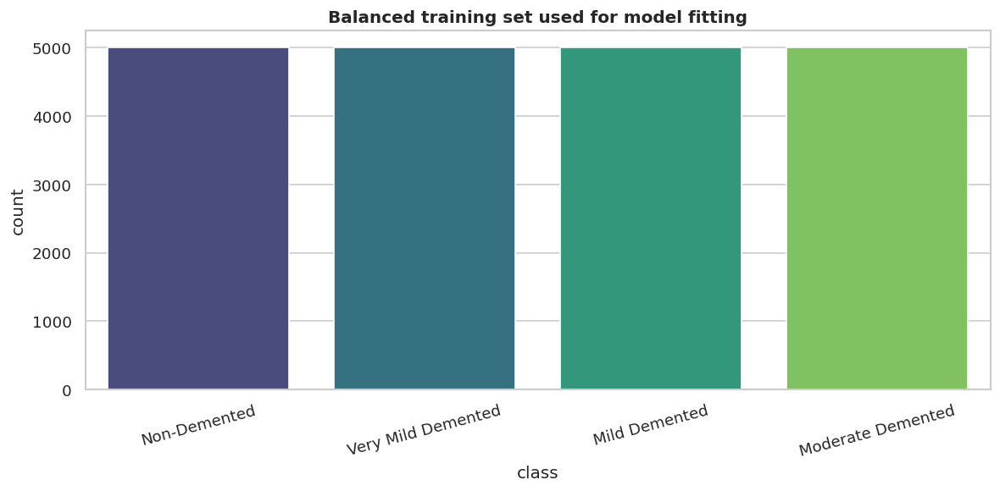

In [18]:
def balance_train(df, target):
    parts, rows = [], []
    for class_name in CLASS_ORDER:
        sub = df[df['class_name']==class_name]
        replace = len(sub) < target
        sampled = sub.sample(target, replace=replace, random_state=SEED)
        parts.append(sampled)
        rows.append({'class': CLASS_PRETTY[class_name], 'before': len(sub), 'after': len(sampled), 'method': 'oversample' if replace else 'undersample'})
    return pd.concat(parts).sample(frac=1, random_state=SEED).reset_index(drop=True), pd.DataFrame(rows)

train_model_df, balance_details = balance_train(train_df, TARGET_TRAIN_PER_CLASS) if BALANCE_TRAINING else (train_df.copy(), pd.DataFrame())
display(balance_details)
balance_details.to_csv(TABLE_DIR / '09_balance_details.csv', index=False)

fig, ax = plt.subplots(figsize=(10,5))
tmp = train_model_df['class_pretty'].value_counts().reindex([CLASS_PRETTY[c] for c in CLASS_ORDER]).reset_index()
tmp.columns = ['class','count']
sns.barplot(data=tmp, x='class', y='count', hue='class', palette='viridis', legend=False, ax=ax)
ax.set_title('Balanced training set used for model fitting', fontweight='bold')
ax.tick_params(axis='x', rotation=15)
savefig('15_balanced_training_set.png')
plt.show()

## 10. TensorFlow data pipeline

In [19]:
def decode_resize(path, label):
    img_bytes = tf.io.read_file(path)
    img = tf.io.decode_image(img_bytes, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    return tf.cast(img, tf.float32), tf.cast(label, tf.int32)

def make_ds(df, shuffle=False, batch=BATCH_SIZE):
    ds = tf.data.Dataset.from_tensor_slices((df['path'].values, df['label_idx'].values.astype('int32')))
    if shuffle:
        ds = ds.shuffle(min(len(df), 5000), seed=SEED, reshuffle_each_iteration=True)
    return ds.map(decode_resize, num_parallel_calls=AUTOTUNE).batch(batch).prefetch(AUTOTUNE)

train_ds = make_ds(train_model_df, shuffle=True)
val_ds = make_ds(val_df)
test_ds = make_ds(test_df)
print('Batches:', tf.data.experimental.cardinality(train_ds).numpy(), tf.data.experimental.cardinality(val_ds).numpy(), tf.data.experimental.cardinality(test_ds).numpy())

I0000 00:00:1788327979.115904    1006 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1788327979.118053    1006 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Batches: 625 345 406


Saved: /kaggle/working/brainscan_ai_outputs/figures/16_preprocessed_batch_preview.png


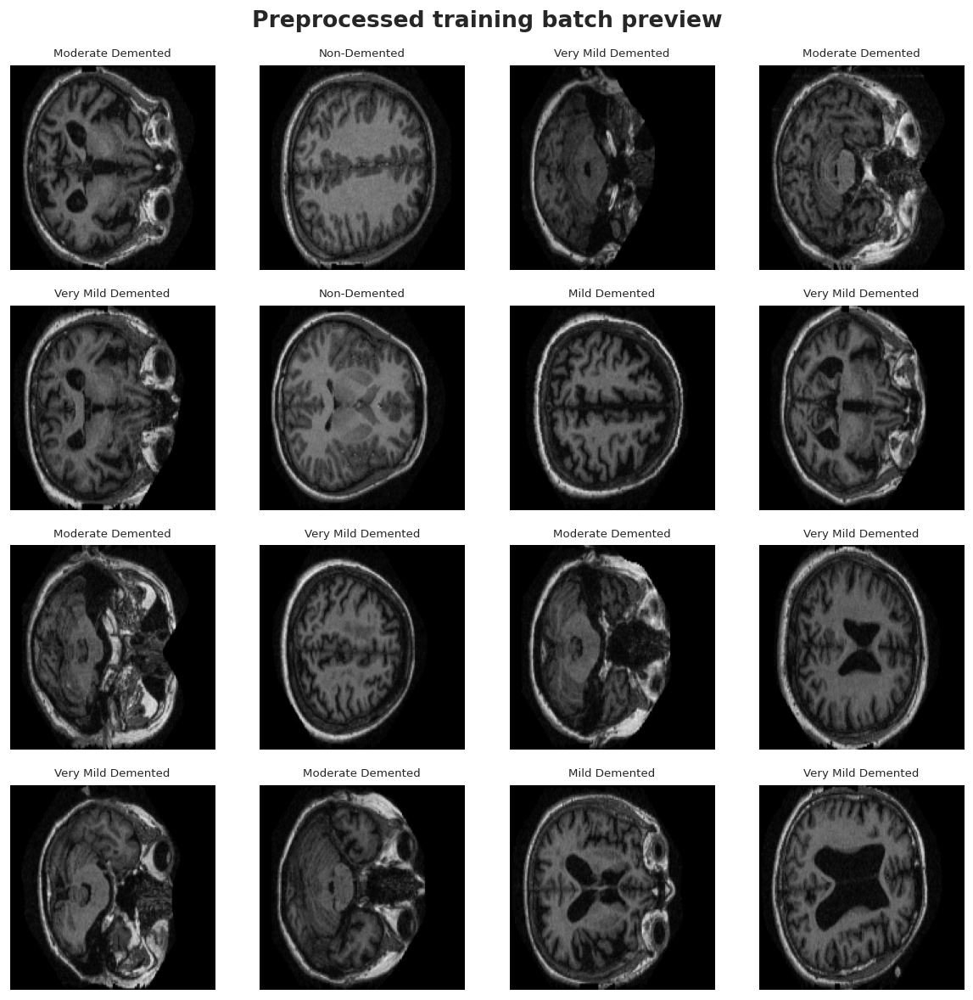

In [20]:
imgs, labs = next(iter(train_ds))
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
axes = axes.ravel()
for i, ax in enumerate(axes):
    ax.imshow(imgs[i].numpy().astype('uint8'), cmap='gray')
    ax.set_title(IDX_TO_PRETTY[int(labs[i])], fontsize=8)
    ax.axis('off')
fig.suptitle('Preprocessed training batch preview', fontsize=16, fontweight='bold')
savefig('16_preprocessed_batch_preview.png')
plt.show()

## 11. Model building functions

In [21]:
def safe_aug():
    return keras.Sequential([
        layers.RandomTranslation(0.025, 0.025, fill_mode='nearest'),
        layers.RandomZoom((-0.04,0.04), (-0.04,0.04), fill_mode='nearest'),
        layers.RandomContrast(0.08)
    ], name='safe_mri_augmentation')

def build_compact_cnn():
    inp = keras.Input((IMG_SIZE, IMG_SIZE, 3), name='mri_image')
    x = safe_aug()(inp)
    x = layers.Rescaling(1/255.)(x)
    for f in [32, 64, 128, 192]:
        x = layers.Conv2D(f, 3, padding='same', use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation('relu')(x)
        x = layers.Conv2D(f, 3, padding='same', use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation('relu')(x)
        x = layers.MaxPooling2D()(x); x = layers.Dropout(.15)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x); x = layers.BatchNormalization()(x); x = layers.Dropout(.35)(x)
    out = layers.Dense(4, activation='softmax', name='severity_probability')(x)
    return keras.Model(inp, out, name='CompactCNN')

def get_backbone(name):
    if name == 'MobileNetV2':
        return tf.keras.applications.mobilenet_v2.preprocess_input, tf.keras.applications.MobileNetV2(include_top=False, weights='imagenet', input_shape=(IMG_SIZE, IMG_SIZE, 3))
    if name == 'ResNet50':
        return tf.keras.applications.resnet50.preprocess_input, tf.keras.applications.ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_SIZE, IMG_SIZE, 3))
    if name == 'EfficientNetB0':
        return tf.keras.applications.efficientnet.preprocess_input, tf.keras.applications.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(IMG_SIZE, IMG_SIZE, 3))
    raise ValueError(name)

def build_transfer(name):
    preprocess, backbone = get_backbone(name)
    backbone._name = name + '_backbone'
    backbone.trainable = False
    inp = keras.Input((IMG_SIZE, IMG_SIZE, 3), name='mri_image')
    x = safe_aug()(inp)
    x = layers.Lambda(preprocess, name=name + '_preprocess')(x)
    x = backbone(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x); x = layers.Dropout(.40)(x)
    x = layers.Dense(128, activation='relu')(x); x = layers.Dropout(.25)(x)
    out = layers.Dense(4, activation='softmax', name='severity_probability')(x)
    return keras.Model(inp, out, name=name)

def compile_model(model, lr):
    model.compile(optimizer=keras.optimizers.Adam(lr), loss='sparse_categorical_crossentropy', metrics=['accuracy', keras.metrics.SparseTopKCategoricalAccuracy(k=2, name='top2_acc')])
    return model

build_compact_cnn().summary()

Model: "CompactCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mri_image (InputLayer)          │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ safe_mri_augmentation           │ (None, 160, 160, 3)    │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 160, 160, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 160, 160, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 160, 160, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 160, 160, 32)   │         9,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 160, 160, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 160, 160, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 80, 80, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 80, 80, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 80, 80, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 80, 80, 64)     │        36,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 80, 80, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 80, 80, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 40, 40, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 40, 40, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 40, 40, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 40, 40, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 40, 40, 128)    │             

 Total params: 894,308 (3.41 MB)

 Trainable params: 892,132 (3.40 MB)

 Non-trainable params: 2,176 (8.50 KB)

## 12. Train model comparison

In [22]:
MODEL_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

weights = compute_class_weight('balanced', classes=np.arange(4), y=train_df['label_idx'].values)
class_weight = {i: float(w) for i, w in enumerate(weights)}
display(pd.DataFrame({'class':[IDX_TO_PRETTY[i] for i in range(4)], 'class_weight':weights}))

def unfreeze_tail(model, fraction=.25):
    for layer in model.layers:
        if isinstance(layer, keras.Model) and layer.name.endswith('_backbone'):
            layer.trainable = True
            start = int(len(layer.layers) * (1 - fraction))
            print(f'{layer.name}: total={len(layer.layers)}, trainable from layer {start}')
            for i, sub in enumerate(layer.layers):
                sub.trainable = (i >= start) and not isinstance(sub, layers.BatchNormalization)

def save_weights(model, outdir, name):
    outdir.mkdir(parents=True, exist_ok=True)
    path = outdir / f'{name}_final.weights.h5'
    model.save_weights(path)
    with open(outdir / f'{name}_metadata.json', 'w') as f:
        json.dump({'model_name': name, 'img_size': IMG_SIZE, 'class_order': CLASS_ORDER, 'disclaimer':'Educational prototype only, not clinical diagnosis'}, f, indent=2)
    return path

def train_one(name, builder, finetune):
    print('\n' + '='*80 + f'\nTraining {name}\n' + '='*80)
    outdir = MODEL_DIR / name
    outdir.mkdir(parents=True, exist_ok=True)
    model = compile_model(builder(), HEAD_LR)
    cb = [
        EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=.35, patience=2, min_lr=1e-6, verbose=1),
        ModelCheckpoint(outdir / f'{name}_head_best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1),
        CSVLogger(outdir / f'{name}_head_log.csv')
    ]
    hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS_HEAD, class_weight=class_weight, callbacks=cb, verbose=1)
    history = {'head_' + k: list(v) for k, v in hist.history.items()}
    best = outdir / f'{name}_head_best.weights.h5'
    if finetune:
        unfreeze_tail(model)
        model = compile_model(model, FINE_LR)
        cb2 = [
            EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
            ReduceLROnPlateau(monitor='val_loss', factor=.35, patience=2, min_lr=1e-7, verbose=1),
            ModelCheckpoint(outdir / f'{name}_finetuned_best.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=1),
            CSVLogger(outdir / f'{name}_finetune_log.csv')
        ]
        hist2 = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS_FINE, class_weight=class_weight, callbacks=cb2, verbose=1)
        for k, v in hist2.history.items(): history['fine_' + k] = list(v)
        if (outdir / f'{name}_finetuned_best.weights.h5').exists(): best = outdir / f'{name}_finetuned_best.weights.h5'
    if best.exists(): model.load_weights(best)
    final_path = save_weights(model, outdir, name)
    print('Saved final weights:', final_path)
    return model, history, str(best)

experiments = [
    ('CompactCNN', build_compact_cnn, False),
    ('MobileNetV2', lambda: build_transfer('MobileNetV2'), True),
    ('ResNet50', lambda: build_transfer('ResNet50'), True),
    ('EfficientNetB0', lambda: build_transfer('EfficientNetB0'), True),
]

trained_models, histories, best_paths = {}, {}, {}
for name, builder, finetune in experiments:
    trained_models[name], histories[name], best_paths[name] = train_one(name, builder, finetune)

,class,class_weight
0,Non-Demented,0.321463
1,Very Mild Demented,1.574476
2,Mild Demented,4.320006
3,Moderate Demented,44.228045



Training CompactCNN
Epoch 1/10


E0000 00:00:1788327989.063395    1006 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/CompactCNN_1/dropout_5_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.4913 - loss: 4.0908 - top2_acc: 0.7400
Epoch 1: val_loss improved from None to 9.52509, saving model to /kaggle/working/brainscan_ai_outputs/models/CompactCNN/CompactCNN_head_best.weights.h5

Epoch 1: finished saving model to /kaggle/working/brainscan_ai_outputs/models/CompactCNN/CompactCNN_head_best.weights.h5
625/625 ━━━━━━━━━━━━━━━━━━━━ 115s 166ms/step - accuracy: 0.5634 - loss: 2.3839 - top2_acc: 0.7931 - val_accuracy: 0.0263 - val_loss: 9.5251 - val_top2_acc: 0.1686 - learning_rate: 0.0010
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.6650 - loss: 1.1296 - top2_acc: 0.8648
Epoch 2: val_loss improved from 9.52509 to 1.12954, saving model to /kaggle/working/brainscan_ai_outputs/models/CompactCNN/CompactCNN_head_best.weights.h5

Epoch 2: finished saving model to /kaggle/working/brainscan_ai_outputs/models/CompactCNN/CompactCNN_head_best.weights.h5
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 173ms/step - accuracy: 0.

E0000 00:00:1788330391.598105    1006 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB0_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.4146 - loss: 4.3386 - top2_acc: 0.6320
Epoch 1: val_loss improved from None to 1.75772, saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_head_best.weights.h5

Epoch 1: finished saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_head_best.weights.h5
625/625 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.4761 - loss: 2.9802 - top2_acc: 0.6880 - val_accuracy: 0.2471 - val_loss: 1.7577 - val_top2_acc: 0.4667 - learning_rate: 0.0010
Epoch 2/10
624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.5690 - loss: 1.6705 - top2_acc: 0.7807
Epoch 2: val_loss did not improve from 1.75772
625/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5740 - loss: 1.6675 - top2_acc: 0.7862 - val_accuracy: 0.2591 - val_loss: 1.7726 - val_top2_acc: 0.4975 - learning_rate: 0.0010
Epoch 3/10
624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.5906 - loss: 1.4709 - top

E0000 00:00:1788330813.545745    1006 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB0_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.7322 - loss: 0.7445 - top2_acc: 0.8995
Epoch 1: val_loss improved from None to 1.19989, saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_finetuned_best.weights.h5

Epoch 1: finished saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_finetuned_best.weights.h5
625/625 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - accuracy: 0.7350 - loss: 0.7305 - top2_acc: 0.9036 - val_accuracy: 0.5180 - val_loss: 1.1999 - val_top2_acc: 0.7829 - learning_rate: 1.0000e-05
Epoch 2/8
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.7403 - loss: 0.6799 - top2_acc: 0.9062
Epoch 2: val_loss improved from 1.19989 to 1.18615, saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_finetuned_best.weights.h5

Epoch 2: finished saving model to /kaggle/working/brainscan_ai_outputs/models/EfficientNetB0/EfficientNetB0_finetuned_best.weights.h5
625/625 

## 13. Training curves

Saved: /kaggle/working/brainscan_ai_outputs/figures/17_training_accuracy.png


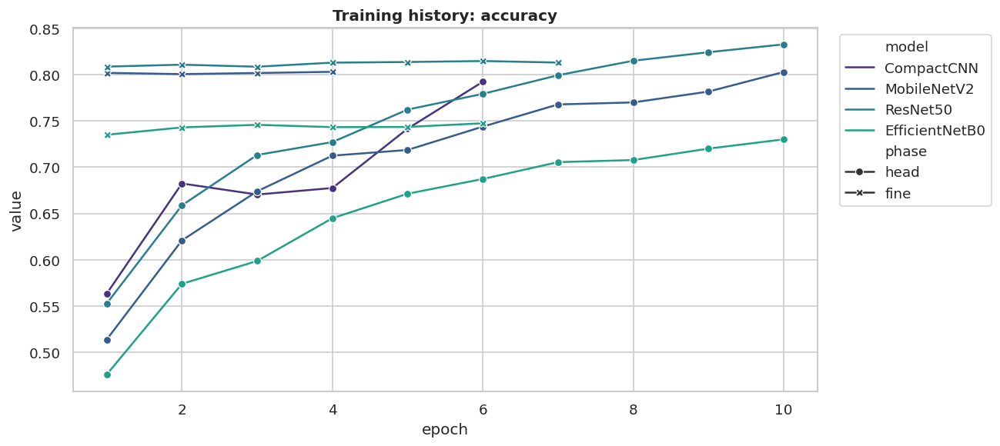

Saved: /kaggle/working/brainscan_ai_outputs/figures/17_training_val_accuracy.png


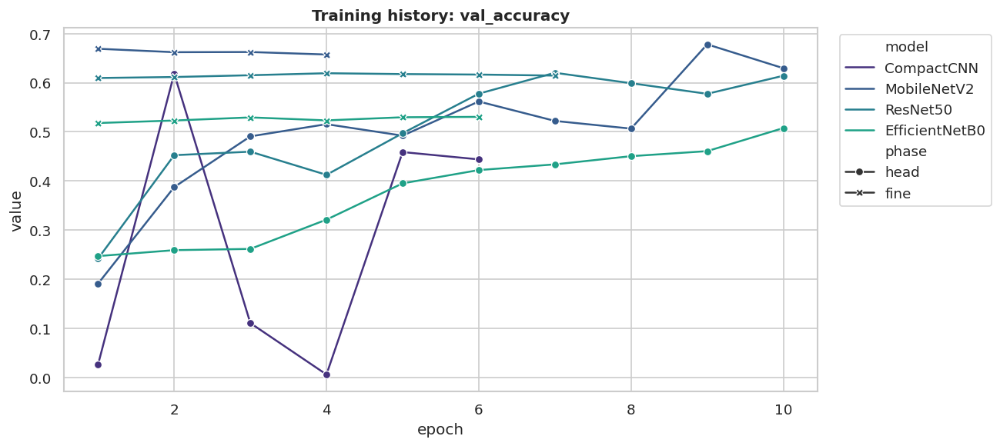

Saved: /kaggle/working/brainscan_ai_outputs/figures/17_training_loss.png


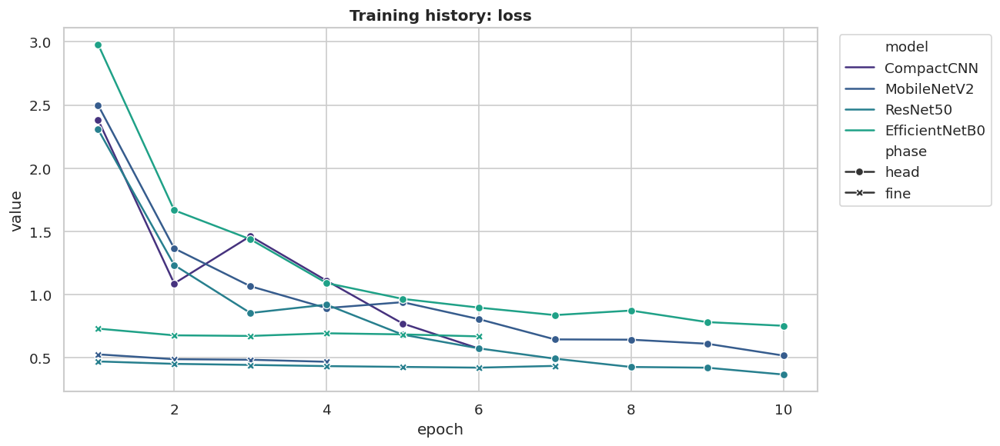

Saved: /kaggle/working/brainscan_ai_outputs/figures/17_training_val_loss.png


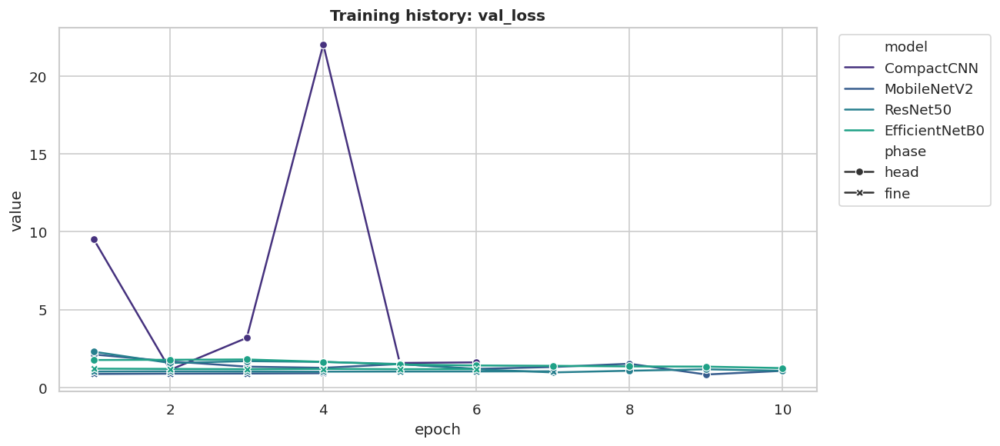

In [23]:
rows=[]
for model, hist in histories.items():
    for key, values in hist.items():
        phase, metric = key.split('_', 1)
        for epoch, value in enumerate(values, 1):
            rows.append({'model': model, 'phase': phase, 'metric': metric, 'epoch': epoch, 'value': value})
history_df = pd.DataFrame(rows)
history_df.to_csv(TABLE_DIR / '10_training_history.csv', index=False)

for metric in ['accuracy','val_accuracy','loss','val_loss']:
    sub = history_df[history_df['metric']==metric]
    if len(sub)==0: continue
    fig, ax = plt.subplots(figsize=(11,5))
    sns.lineplot(data=sub, x='epoch', y='value', hue='model', style='phase', markers=True, dashes=False, ax=ax)
    ax.set_title(f'Training history: {metric}', fontweight='bold')
    ax.legend(bbox_to_anchor=(1.02,1), loc='upper left')
    savefig(f'17_training_{metric}.png')
    plt.show()

## 14. Test metrics and model comparison

In [24]:
def pred_df(model, df):
    prob = model.predict(make_ds(df, shuffle=False), verbose=0)
    y_true = df['label_idx'].values.astype(int)
    y_pred = prob.argmax(axis=1)
    return y_true, y_pred, prob

def multiclass_brier(y, p):
    oh = np.eye(4)[y]
    return float(np.mean(np.sum((p-oh)**2, axis=1)))

def ece_score(y, p, bins=10):
    conf = p.max(axis=1); pred = p.argmax(axis=1); correct = (pred==y).astype(float)
    ece = 0
    rows = []
    for i in range(bins):
        lo, hi = i/bins, (i+1)/bins
        m = (conf > lo) & (conf <= hi)
        if m.sum() == 0:
            rows.append({'bin': i+1, 'count':0, 'avg_confidence':np.nan, 'accuracy':np.nan}); continue
        rows.append({'bin': i+1, 'count':int(m.sum()), 'avg_confidence':conf[m].mean(), 'accuracy':correct[m].mean()})
        ece += (m.mean()) * abs(conf[m].mean() - correct[m].mean())
    return float(ece), pd.DataFrame(rows)

def metric_row(model_name, split, y, yp, p):
    pm, rm, f1m, _ = precision_recall_fscore_support(y, yp, average='macro', zero_division=0)
    pw, rw, f1w, _ = precision_recall_fscore_support(y, yp, average='weighted', zero_division=0)
    ybin = label_binarize(y, classes=[0,1,2,3])
    try: roc = roc_auc_score(ybin, p, average='macro', multi_class='ovr')
    except Exception: roc = np.nan
    try: ap = average_precision_score(ybin, p, average='macro')
    except Exception: ap = np.nan
    top2 = np.mean([yt in np.argsort(pr)[-2:] for yt, pr in zip(y, p)])
    ece, _ = ece_score(y, p)
    return {'model':model_name, 'split':split, 'accuracy':accuracy_score(y,yp), 'balanced_accuracy':balanced_accuracy_score(y,yp),
            'macro_precision':pm, 'macro_recall':rm, 'macro_f1':f1m, 'weighted_f1':f1w, 'top2_accuracy':top2,
            'roc_auc_macro_ovr':roc, 'pr_auc_macro':ap, 'cohen_kappa':cohen_kappa_score(y,yp),
            'quadratic_weighted_kappa':cohen_kappa_score(y,yp,weights='quadratic'), 'mean_absolute_severity_error':np.abs(y-yp).mean(),
            'multiclass_brier':multiclass_brier(y,p), 'expected_calibration_error':ece}

predictions = {}
rows=[]
for name, model in trained_models.items():
    for split, df_part in [('validation', val_df), ('test', test_df)]:
        y, yp, p = pred_df(model, df_part)
        predictions[(name, split)] = (y, yp, p)
        rows.append(metric_row(name, split, y, yp, p))
metrics_df = pd.DataFrame(rows)
metrics_df.to_csv(TABLE_DIR / '11_model_metrics.csv', index=False)
display(metrics_df.sort_values(['split','macro_f1'], ascending=[True,False]).round(4))

best_model_name = metrics_df[metrics_df['split']=='validation'].sort_values('macro_f1', ascending=False).iloc[0]['model']
best_model = trained_models[best_model_name]
print('Best model selected by validation macro-F1:', best_model_name)

,model,split,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,top2_accuracy,roc_auc_macro_ovr,pr_auc_macro,cohen_kappa,quadratic_weighted_kappa,mean_absolute_severity_error,multiclass_brier,expected_calibration_error
3,MobileNetV2,test,0.6731,0.8216,0.5487,0.8216,0.6083,0.7069,0.9027,0.9261,0.7664,0.4038,0.4570,0.4034,0.4634,0.1441
5,ResNet50,test,0.6192,0.8348,0.4773,0.8348,0.5191,0.6586,0.8409,0.9261,0.8079,0.3608,0.3606,0.5172,0.5336,0.1662
1,CompactCNN,test,0.6255,0.7795,0.4701,0.7795,0.5152,0.6738,0.8097,0.8903,0.6532,0.3279,0.3649,0.5241,0.5397,0.1701
7,EfficientNetB0,test,0.5351,0.8073,0.4519,0.8073,0.4662,0.5743,0.7884,0.9136,0.7882,0.2860,0.2923,0.6266,0.6395,0.2064
2,MobileNetV2,validation,0.6692,0.8063,0.5549,0.8063,0.6101,0.7033,0.9010,0.9224,0.7642,0.3970,0.4494,0.4079,0.4675,0.1462
4,ResNet50,validation,0.6194,0.8348,0.4849,0.8348,0.5282,0.6587,0.8369,0.9267,0.8091,0.3616,0.3657,0.5121,0.5319,0.1659
0,CompactCNN,validation,0.6185,0.7788,0.4666,0.7788,0.5095,0.6680,0.8030,0.8889,0.6280,0.3231,0.3568,0.5364,0.5473,0.1749
6,EfficientNetB0,validation,0.5294,0.7995,0.4518,0.7995,0.4662,0.5701,0.7910,0.9119,0.7953,0.2775,0.2937,0.6307,0.6394,0.2074


Best model selected by validation macro-F1: MobileNetV2


Saved: /kaggle/working/brainscan_ai_outputs/figures/18_model_comparison_metrics.png


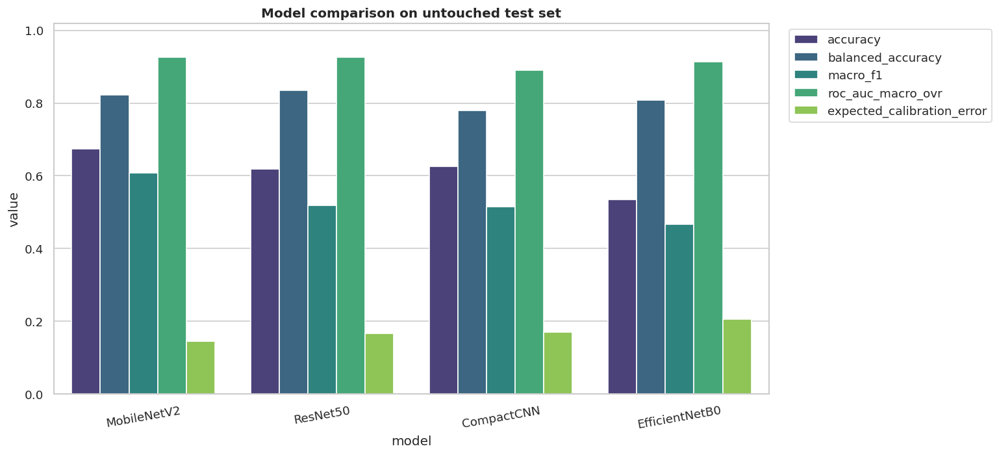

Saved: /kaggle/working/brainscan_ai_outputs/figures/19_macro_f1_ranking.png


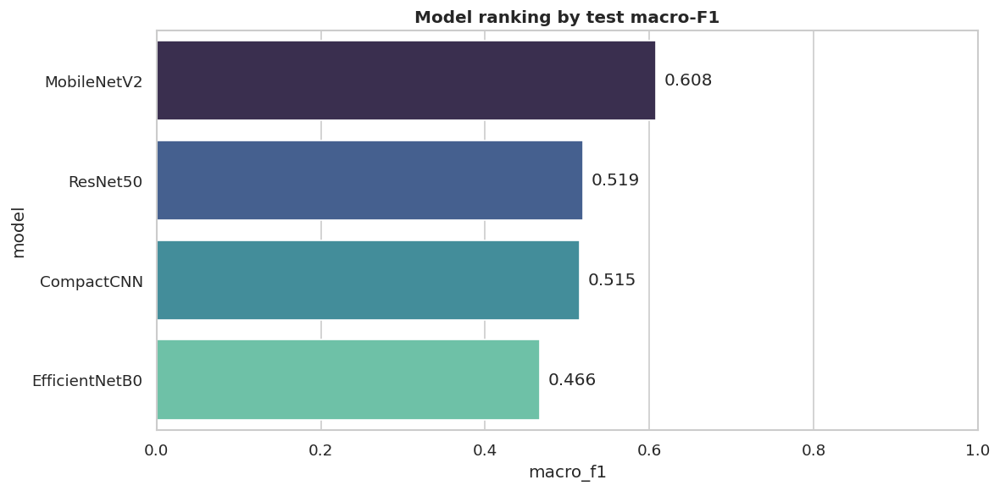

In [ ]:
test_metrics = metrics_df[metrics_df['split']=='test'].sort_values('macro_f1', ascending=False)
plot_cols = ['accuracy','balanced_accuracy','macro_f1','roc_auc_macro_ovr','expected_calibration_error']
long = test_metrics.melt(id_vars='model', value_vars=plot_cols, var_name='metric', value_name='value')

fig, ax = plt.subplots(figsize=(13,6))
sns.barplot(data=long, x='model', y='value', hue='metric', palette='viridis', ax=ax)
ax.set_title('Model comparison on untouched test set', fontweight='bold')
ax.set_ylim(0, max(1, long['value'].max()*1.1)); ax.tick_params(axis='x', rotation=10)
ax.legend(bbox_to_anchor=(1.02,1), loc='upper left')
savefig('18_model_comparison_metrics.png')
plt.show()

fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=test_metrics, x='macro_f1', y='model', hue='model', palette='mako', legend=False, ax=ax)
ax.set_xlim(0,1); ax.set_title('Model ranking by test macro-F1', fontweight='bold')
for p in ax.patches: ax.annotate(f'{p.get_width():.3f}', (p.get_width()+.01, p.get_y()+p.get_height()/2), va='center')
savefig('19_macro_f1_ranking.png')
plt.show()

## 15. Per-class metrics and confusion matrices

,model,class,precision,recall,f1_score,support
0,CompactCNN,Non-Demented,0.9549,0.6153,0.7484,10084.0
1,CompactCNN,Very Mild Demented,0.3448,0.5386,0.4205,2059.0
2,CompactCNN,Mild Demented,0.2379,0.9640,0.3816,750.0
3,CompactCNN,Moderate Demented,0.3427,1.0000,0.5105,73.0
4,MobileNetV2,Non-Demented,0.9746,0.6234,0.7604,10084.0
5,MobileNetV2,Very Mild Demented,0.3645,0.8286,0.5062,2059.0
6,MobileNetV2,Mild Demented,0.3958,0.8893,0.5478,750.0
7,MobileNetV2,Moderate Demented,0.4600,0.9452,0.6188,73.0
8,ResNet50,Non-Demented,0.9907,0.5510,0.7081,10084.0
9,ResNet50,Very Mild Demented,0.3589,0.8082,0.4970,2059.0


Saved: /kaggle/working/brainscan_ai_outputs/figures/20_per_class_precision.png


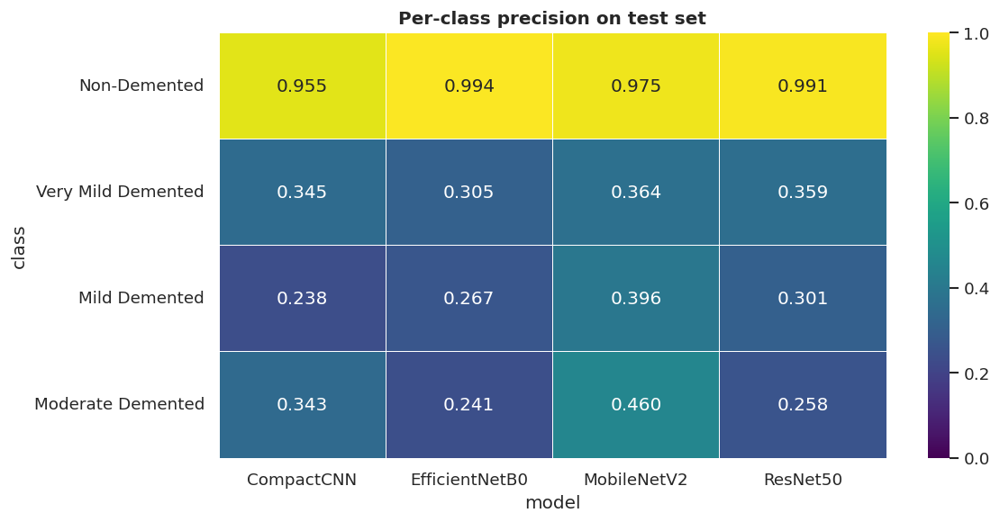

Saved: /kaggle/working/brainscan_ai_outputs/figures/20_per_class_recall.png


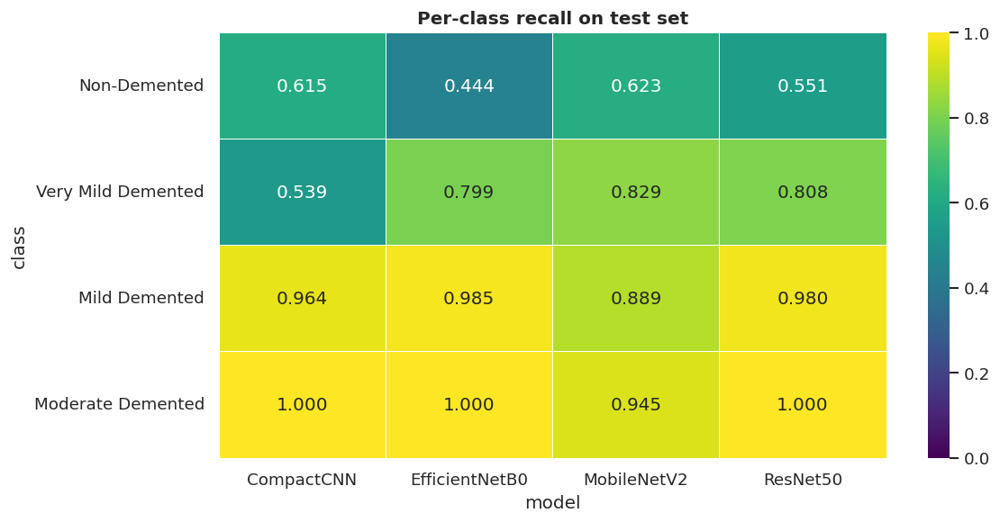

Saved: /kaggle/working/brainscan_ai_outputs/figures/20_per_class_f1_score.png


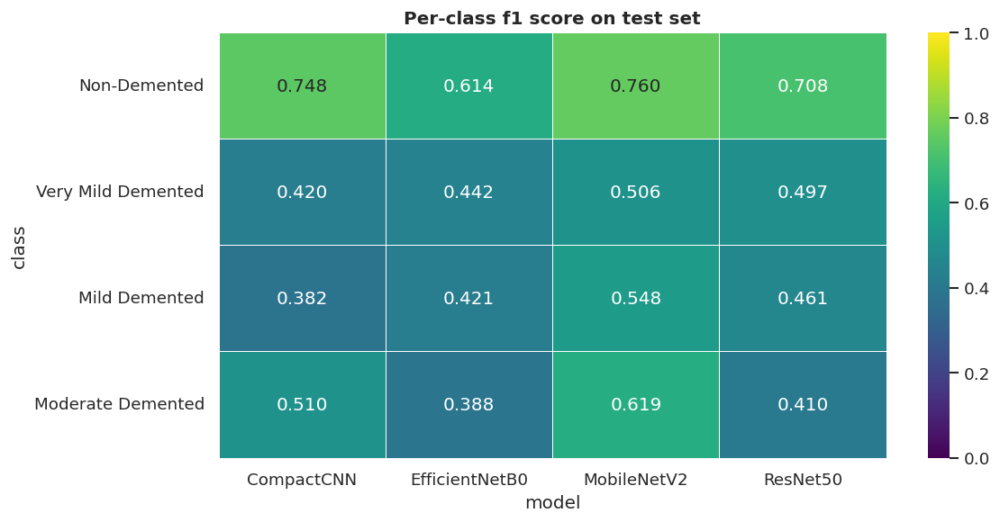

In [ ]:
per_rows=[]
for name in trained_models:
    y, yp, p = predictions[(name,'test')]
    rep = classification_report(y, yp, labels=[0,1,2,3], target_names=[IDX_TO_PRETTY[i] for i in range(4)], output_dict=True, zero_division=0)
    for cls in [IDX_TO_PRETTY[i] for i in range(4)]:
        per_rows.append({'model':name, 'class':cls, 'precision':rep[cls]['precision'], 'recall':rep[cls]['recall'], 'f1_score':rep[cls]['f1-score'], 'support':rep[cls]['support']})
per_class_df = pd.DataFrame(per_rows)
per_class_df.to_csv(TABLE_DIR / '12_per_class_metrics.csv', index=False)
display(per_class_df.round(4))

for metric in ['precision','recall','f1_score']:
    heat = per_class_df.pivot(index='class', columns='model', values=metric).reindex([IDX_TO_PRETTY[i] for i in range(4)])
    fig, ax = plt.subplots(figsize=(10,5))
    sns.heatmap(heat, annot=True, fmt='.3f', cmap='viridis', vmin=0, vmax=1, linewidths=.5, ax=ax)
    ax.set_title(f'Per-class {metric.replace("_"," ")} on test set', fontweight='bold')
    savefig(f'20_per_class_{metric}.png')
    plt.show()

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_CompactCNN_confusion_counts.png


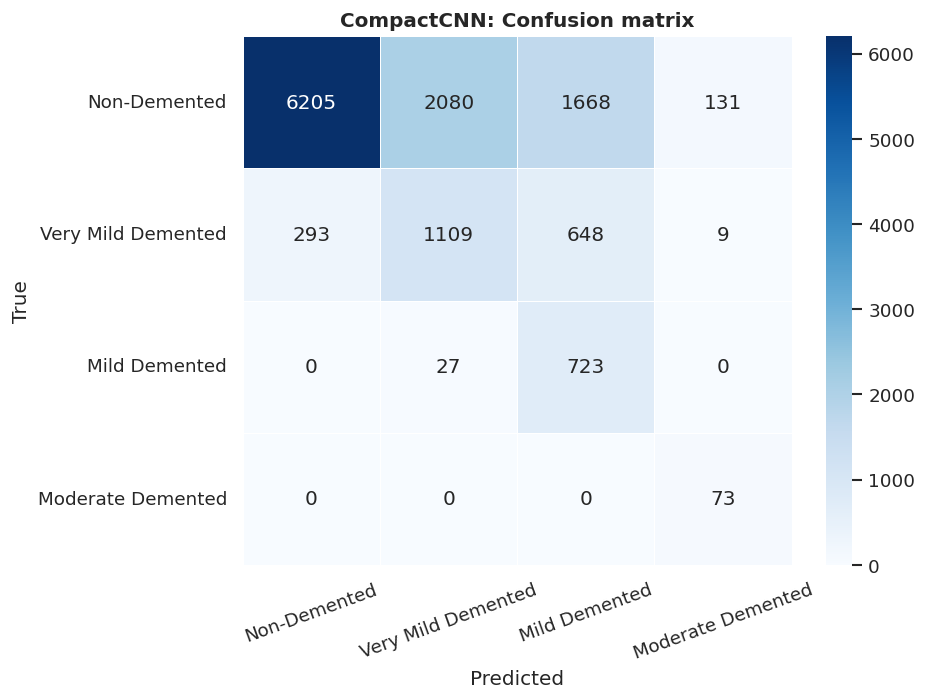

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_CompactCNN_confusion_normalised.png


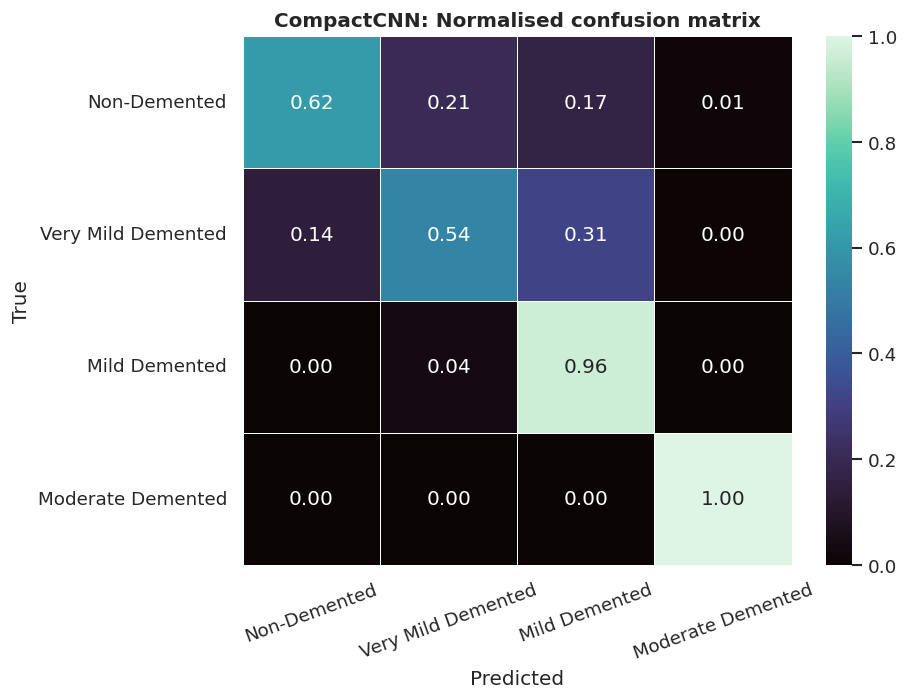

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_MobileNetV2_confusion_counts.png


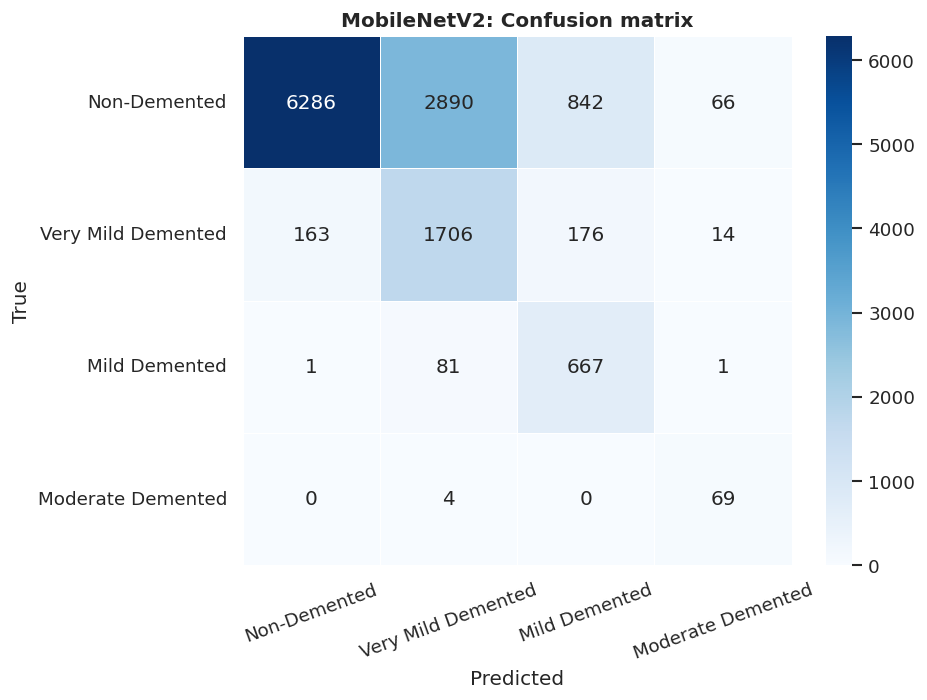

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_MobileNetV2_confusion_normalised.png


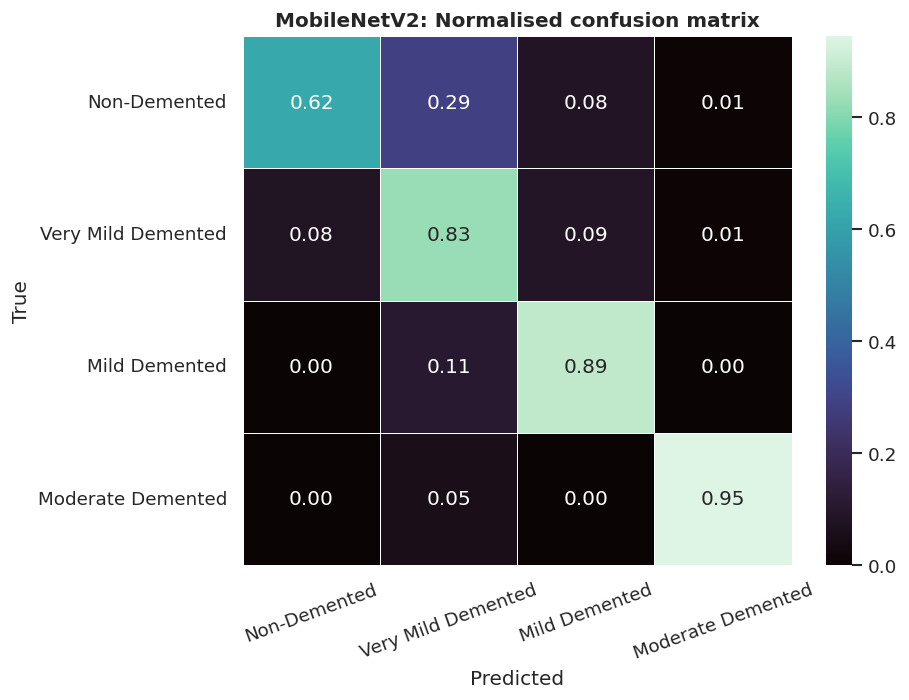

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_ResNet50_confusion_counts.png


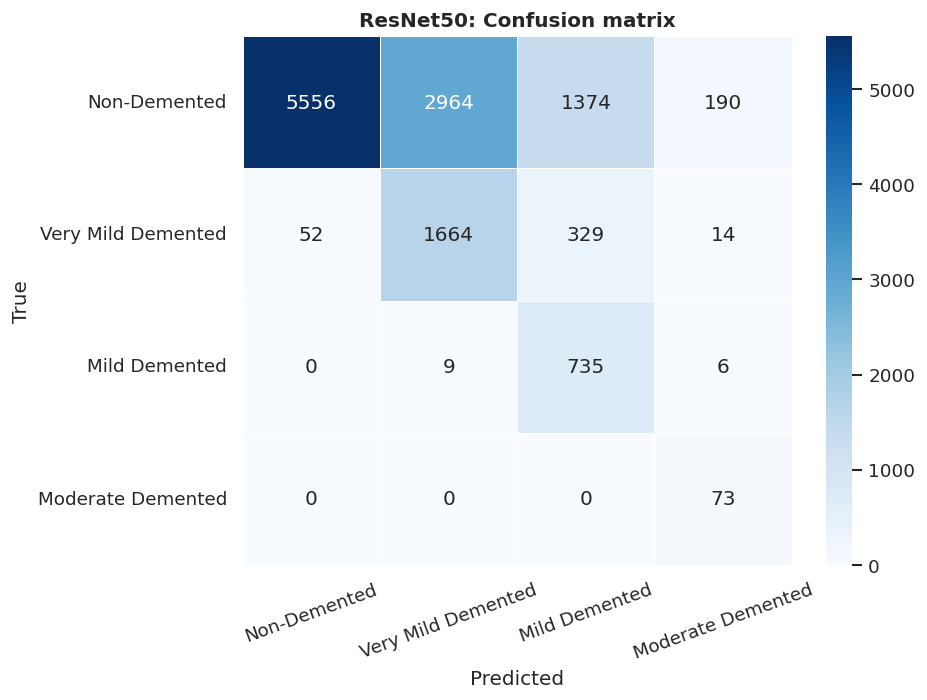

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_ResNet50_confusion_normalised.png


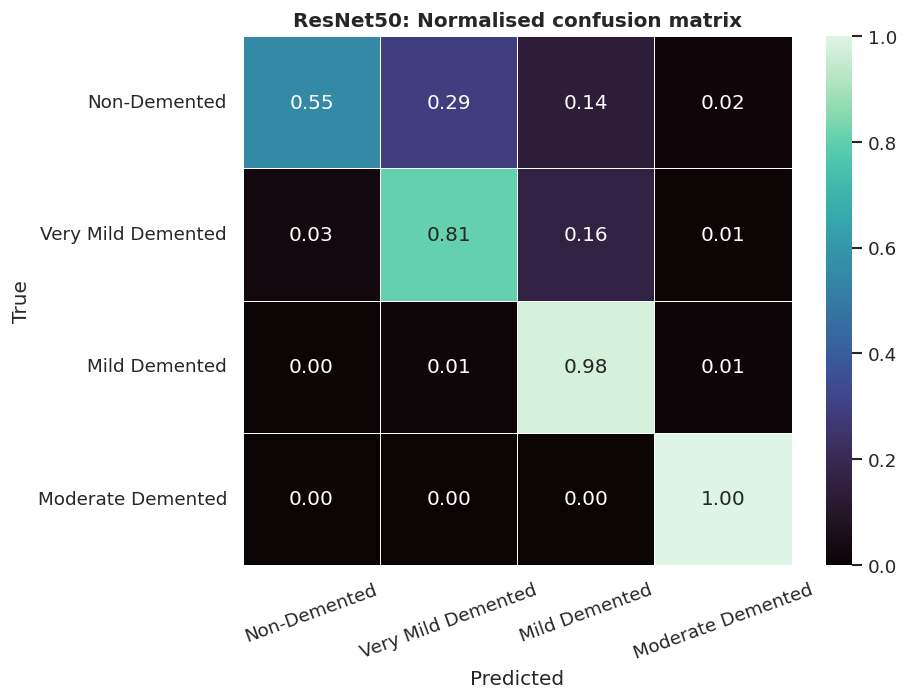

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_EfficientNetB0_confusion_counts.png


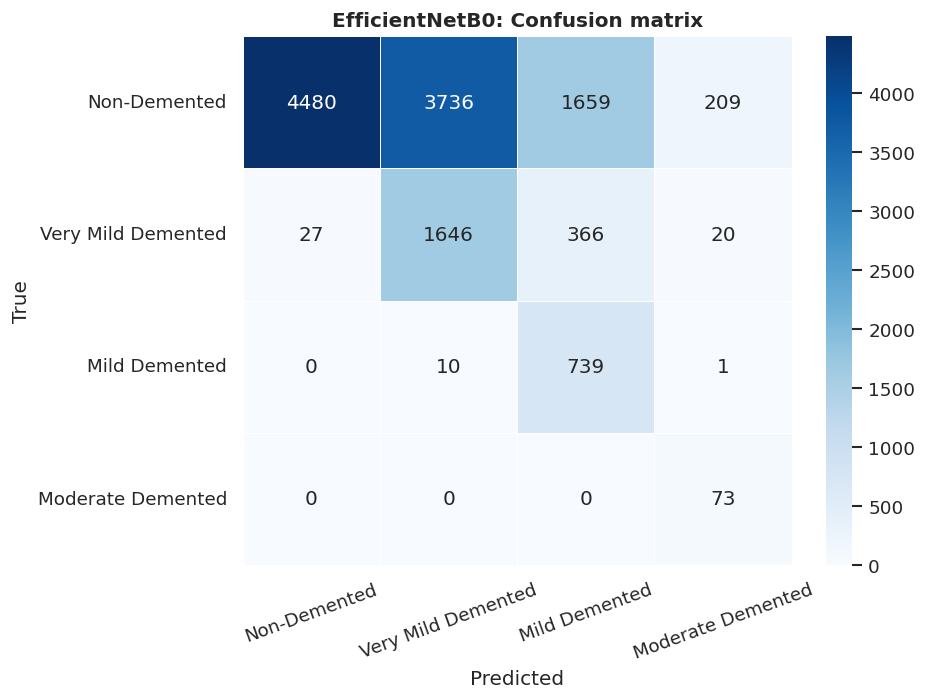

Saved: /kaggle/working/brainscan_ai_outputs/figures/21_EfficientNetB0_confusion_normalised.png


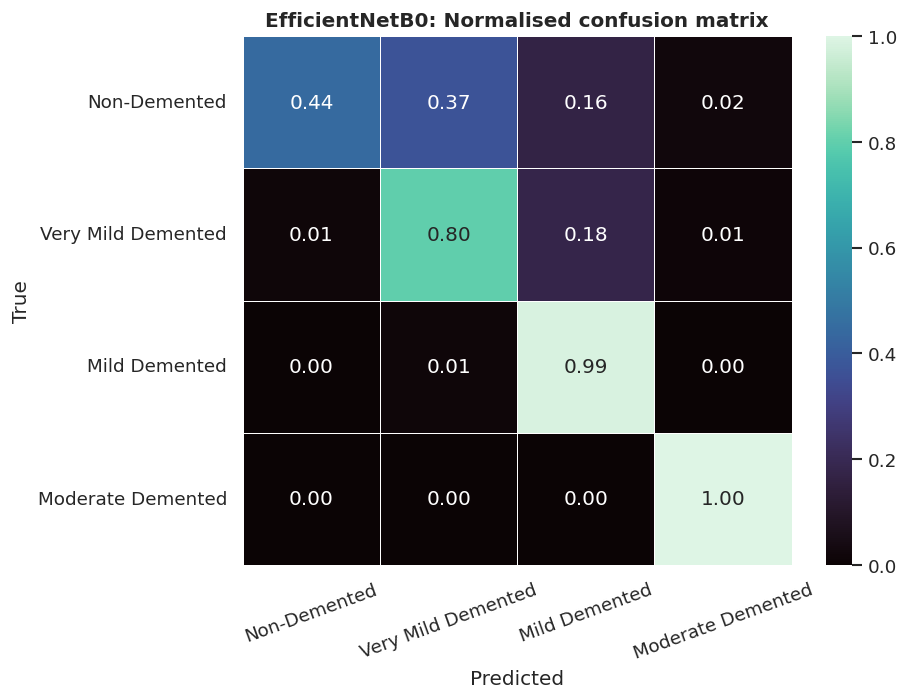

In [ ]:
labels_pretty = [IDX_TO_PRETTY[i] for i in range(4)]
for name in trained_models:
    y, yp, p = predictions[(name,'test')]
    cm = confusion_matrix(y, yp, labels=[0,1,2,3])
    cmn = cm / np.maximum(cm.sum(axis=1, keepdims=True), 1)
    for data, fmt, cmap, suffix, title in [(cm, 'd', 'Blues', 'counts', 'Confusion matrix'), (cmn, '.2f', 'mako', 'normalised', 'Normalised confusion matrix')]:
        fig, ax = plt.subplots(figsize=(8,6))
        sns.heatmap(data, annot=True, fmt=fmt, cmap=cmap, xticklabels=labels_pretty, yticklabels=labels_pretty, linewidths=.4, ax=ax)
        ax.set_title(f'{name}: {title}', fontweight='bold')
        ax.set_xlabel('Predicted'); ax.set_ylabel('True')
        ax.tick_params(axis='x', rotation=20); ax.tick_params(axis='y', rotation=0)
        savefig(f'21_{name}_confusion_{suffix}.png')
        plt.show()

## 16. ROC, Precision-Recall, confidence and calibration for best model

Saved: /kaggle/working/brainscan_ai_outputs/figures/22_best_model_roc.png


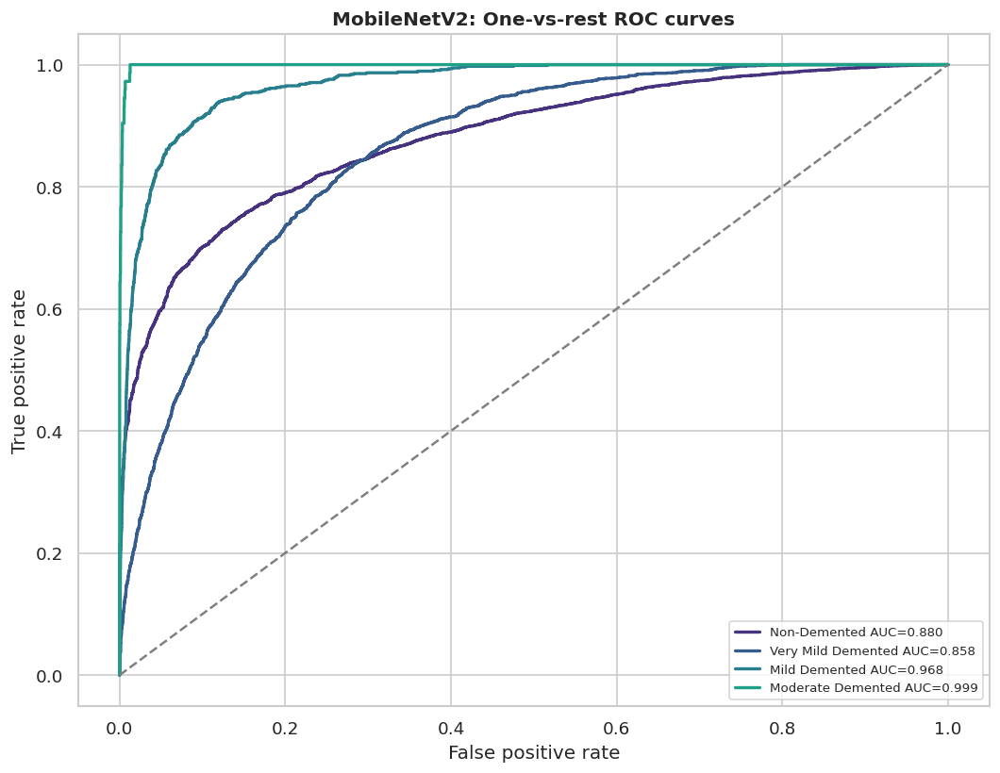

Saved: /kaggle/working/brainscan_ai_outputs/figures/23_best_model_pr.png


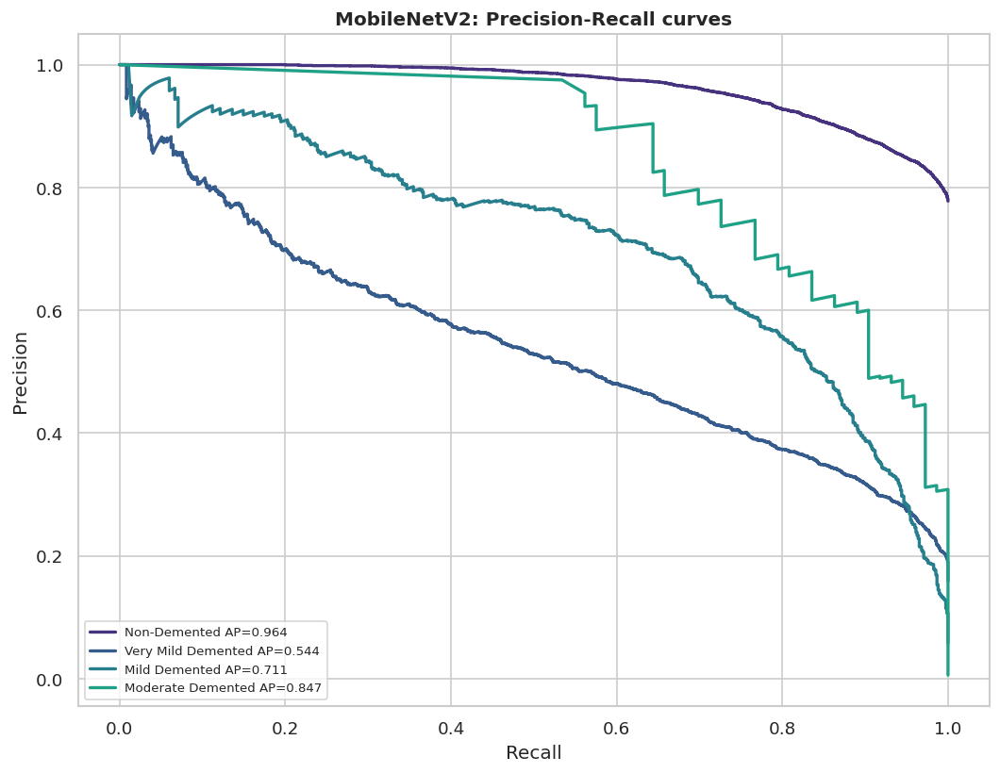

Saved: /kaggle/working/brainscan_ai_outputs/figures/24_best_model_confidence.png


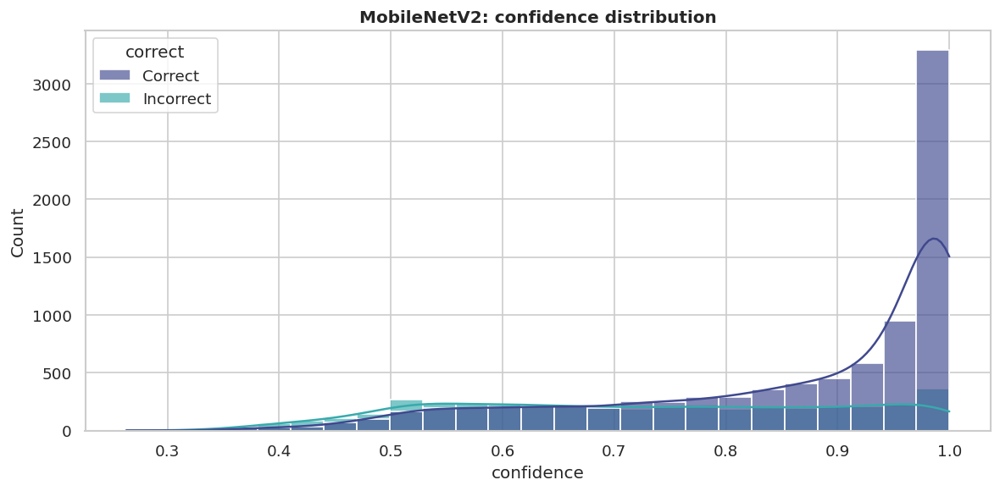

Saved: /kaggle/working/brainscan_ai_outputs/figures/25_best_model_calibration.png


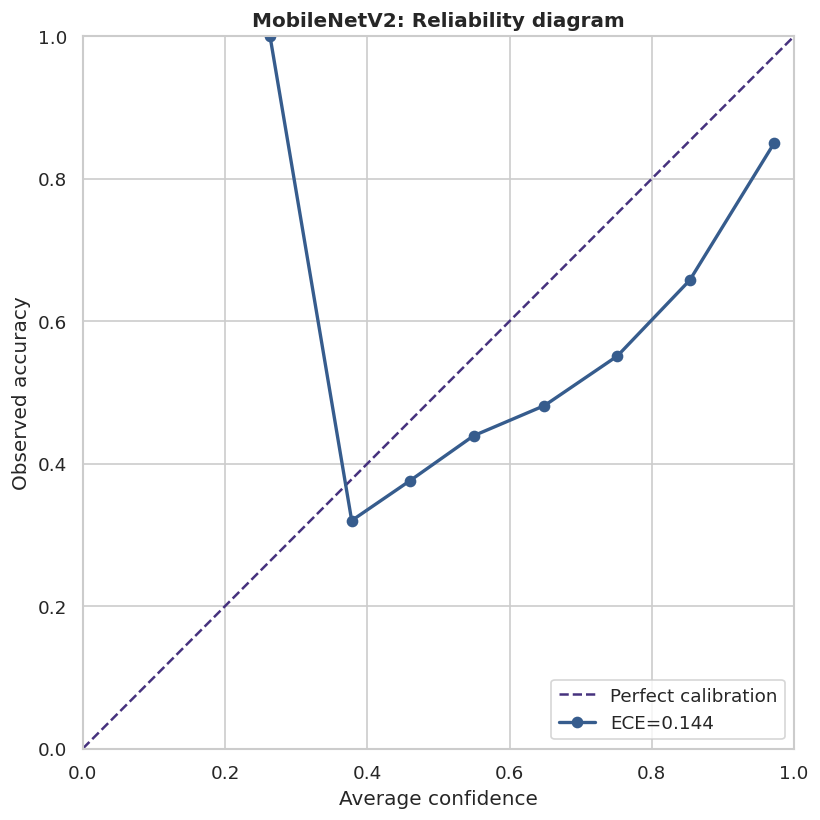

In [ ]:
y, yp, p = predictions[(best_model_name,'test')]
ybin = label_binarize(y, classes=[0,1,2,3])

fig, ax = plt.subplots(figsize=(9,7))
for i in range(4):
    fpr, tpr, _ = roc_curve(ybin[:,i], p[:,i])
    ax.plot(fpr, tpr, linewidth=2, label=f'{IDX_TO_PRETTY[i]} AUC={auc(fpr,tpr):.3f}')
ax.plot([0,1],[0,1],'--', color='gray')
ax.set_title(f'{best_model_name}: One-vs-rest ROC curves', fontweight='bold')
ax.set_xlabel('False positive rate'); ax.set_ylabel('True positive rate'); ax.legend(fontsize=8)
savefig('22_best_model_roc.png')
plt.show()

fig, ax = plt.subplots(figsize=(9,7))
for i in range(4):
    pr, rc, _ = precision_recall_curve(ybin[:,i], p[:,i])
    ap = average_precision_score(ybin[:,i], p[:,i])
    ax.plot(rc, pr, linewidth=2, label=f'{IDX_TO_PRETTY[i]} AP={ap:.3f}')
ax.set_title(f'{best_model_name}: Precision-Recall curves', fontweight='bold')
ax.set_xlabel('Recall'); ax.set_ylabel('Precision'); ax.legend(fontsize=8)
savefig('23_best_model_pr.png')
plt.show()

conf = p.max(axis=1)
correct = yp == y
conf_df = pd.DataFrame({'confidence':conf, 'correct':np.where(correct,'Correct','Incorrect')})
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(data=conf_df, x='confidence', hue='correct', bins=25, kde=True, palette='mako', alpha=.65, ax=ax)
ax.set_title(f'{best_model_name}: confidence distribution', fontweight='bold')
savefig('24_best_model_confidence.png')
plt.show()

ece, cal = ece_score(y,p)
cal.to_csv(TABLE_DIR / '13_calibration_bins.csv', index=False)
fig, ax = plt.subplots(figsize=(7,7))
ax.plot([0,1],[0,1],'--', label='Perfect calibration')
ax.plot(cal['avg_confidence'], cal['accuracy'], marker='o', linewidth=2, label=f'ECE={ece:.3f}')
ax.set_xlim(0,1); ax.set_ylim(0,1); ax.set_xlabel('Average confidence'); ax.set_ylabel('Observed accuracy')
ax.set_title(f'{best_model_name}: Reliability diagram', fontweight='bold'); ax.legend()
savefig('25_best_model_calibration.png')
plt.show()

## 17. Error analysis and balanced diagnostic test subset

,severity_distance,count
0,0,8728
1,1,3311
2,2,861
3,3,66


Saved: /kaggle/working/brainscan_ai_outputs/figures/26_severity_distance.png


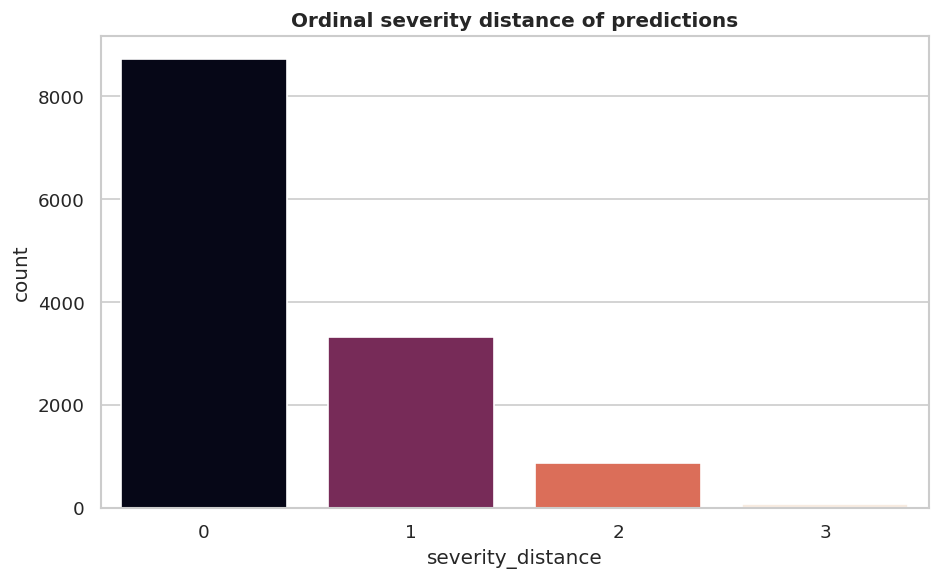

Saved: /kaggle/working/brainscan_ai_outputs/figures/27_misclassified_examples.png


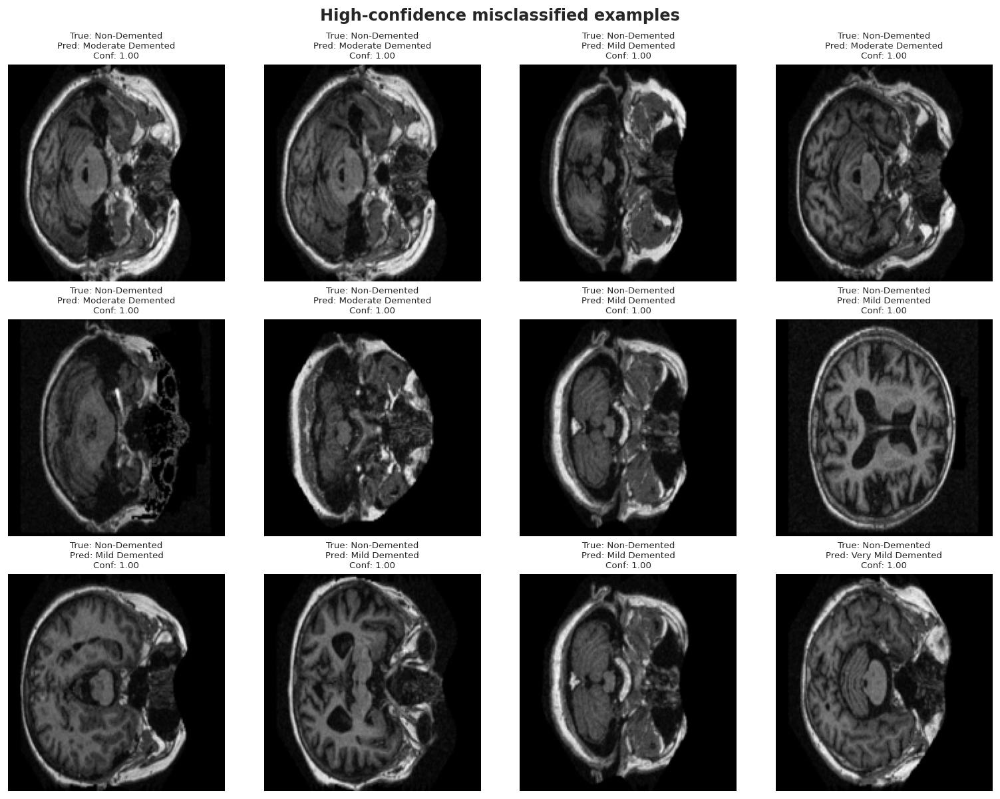

In [ ]:
y, yp, p = predictions[(best_model_name,'test')]
error_df = test_df.copy()
error_df['true_class'] = [IDX_TO_PRETTY[i] for i in y]
error_df['predicted_class'] = [IDX_TO_PRETTY[i] for i in yp]
error_df['confidence'] = p.max(axis=1)
error_df['correct'] = y == yp
error_df['severity_distance'] = np.abs(y - yp)
error_df.to_csv(TABLE_DIR / '14_error_analysis.csv', index=False)

dist = error_df.groupby('severity_distance').size().reset_index(name='count')
display(dist)
fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(data=dist, x='severity_distance', y='count', hue='severity_distance', palette='rocket', legend=False, ax=ax)
ax.set_title('Ordinal severity distance of predictions', fontweight='bold')
savefig('26_severity_distance.png')
plt.show()

mis = error_df[~error_df['correct']].sort_values('confidence', ascending=False).head(12)
if len(mis) > 0:
    fig, axes = plt.subplots(math.ceil(len(mis)/4), 4, figsize=(13, 3.4*math.ceil(len(mis)/4)))
    axes = np.array(axes).ravel()
    for ax in axes: ax.axis('off')
    for i, (_, row) in enumerate(mis.iterrows()):
        axes[i].imshow(load_pil(row['path'], IMG_SIZE, 'L'), cmap='gray')
        axes[i].set_title(f"True: {row['true_class']}\nPred: {row['predicted_class']}\nConf: {row['confidence']:.2f}", fontsize=8)
    fig.suptitle('High-confidence misclassified examples', fontweight='bold')
    savefig('27_misclassified_examples.png')
    plt.show()
else:
    print('No misclassified examples found.')

,model,split,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,top2_accuracy,roc_auc_macro_ovr,pr_auc_macro,cohen_kappa,quadratic_weighted_kappa,mean_absolute_severity_error,multiclass_brier,expected_calibration_error
2,ResNet50,balanced_test_subset,0.8527,0.8527,0.8699,0.8527,0.8464,0.8464,0.9418,0.9684,0.9261,0.8037,0.8787,0.1918,0.2282,0.0434
1,MobileNetV2,balanced_test_subset,0.8288,0.8288,0.8402,0.8288,0.8279,0.8279,0.9486,0.9545,0.8900,0.7717,0.8699,0.2158,0.2564,0.0519
3,EfficientNetB0,balanced_test_subset,0.8356,0.8356,0.8621,0.8356,0.8272,0.8272,0.9315,0.9632,0.9078,0.7808,0.8378,0.2295,0.2545,0.0331
0,CompactCNN,balanced_test_subset,0.8014,0.8014,0.8160,0.8014,0.7971,0.7971,0.9349,0.9408,0.8531,0.7352,0.8500,0.2500,0.2968,0.0569


Saved: /kaggle/working/brainscan_ai_outputs/figures/28_balanced_test_macro_f1.png


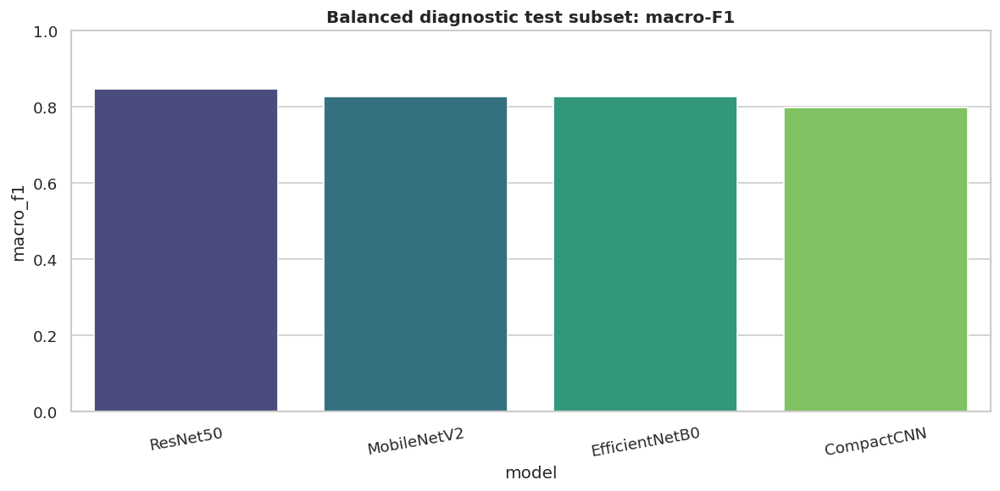

In [ ]:
def balanced_subset(df):
    n = df['class_name'].value_counts().min()
    return pd.concat([df[df['class_name']==c].sample(n, random_state=SEED) for c in CLASS_ORDER]).sample(frac=1, random_state=SEED).reset_index(drop=True)

balanced_test = balanced_subset(test_df)
rows=[]
for name, model in trained_models.items():
    yb, ypb, pb = pred_df(model, balanced_test)
    rows.append(metric_row(name, 'balanced_test_subset', yb, ypb, pb))
bal_metrics = pd.DataFrame(rows).sort_values('macro_f1', ascending=False)
bal_metrics.to_csv(TABLE_DIR / '15_balanced_test_metrics.csv', index=False)
display(bal_metrics.round(4))

fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=bal_metrics, x='model', y='macro_f1', hue='model', palette='viridis', legend=False, ax=ax)
ax.set_title('Balanced diagnostic test subset: macro-F1', fontweight='bold')
ax.set_ylim(0,1); ax.tick_params(axis='x', rotation=10)
savefig('28_balanced_test_macro_f1.png')
plt.show()

## 18. Grad-CAM explainability

Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer: mobilenetv2_1.00_160/Conv_1
Selected backbone for Grad-CAM: mobilenetv2_1.00_160
Conv2D layers inside selected backbone: 35
Grad-CAM target layer:

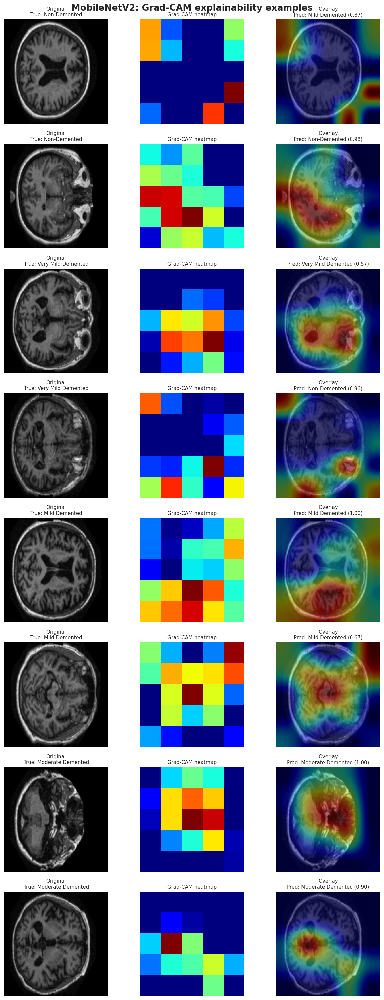

In [33]:
# ===============================
# Grad-CAM explainability
# Fixed robust version for nested transfer-learning models
# ===============================

def safe_apply_layer(layer, x):
    """
    Safely applies a layer during Grad-CAM forward pass.
    Skips InputLayer and handles layers that do/don't accept training=False.
    """
    if isinstance(layer, layers.InputLayer):
        return x

    try:
        return layer(x, training=False)
    except TypeError:
        try:
            return layer(x)
        except TypeError:
            return layer.call(x)


def count_conv_layers(model_or_layer):
    """
    Counts Conv2D layers recursively inside a layer/model.
    """
    count = 0

    if isinstance(model_or_layer, layers.Conv2D):
        return 1

    if hasattr(model_or_layer, "layers"):
        for sub_layer in model_or_layer.layers:
            count += count_conv_layers(sub_layer)

    return count


def find_cnn_backbone(model):
    """
    Finds the nested CNN backbone by selecting the nested model
    with the largest number of Conv2D layers.
    This avoids selecting the augmentation Sequential model.
    """
    candidates = []

    for layer in model.layers:
        if isinstance(layer, keras.Model):
            conv_count = count_conv_layers(layer)
            if conv_count > 0:
                candidates.append((layer, conv_count))

    if len(candidates) == 0:
        return None

    candidates = sorted(candidates, key=lambda x: x[1], reverse=True)
    backbone = candidates[0][0]

    print(f"Selected backbone for Grad-CAM: {backbone.name}")
    print(f"Conv2D layers inside selected backbone: {candidates[0][1]}")

    return backbone


def find_last_conv2d(model_or_layer):
    """
    Finds the last Conv2D layer recursively.
    """
    if hasattr(model_or_layer, "layers"):
        for layer in reversed(model_or_layer.layers):
            found = find_last_conv2d(layer)
            if found is not None:
                return found

    if isinstance(model_or_layer, layers.Conv2D):
        return model_or_layer

    return None


def split_model_layers(model, backbone):
    """
    Splits the main model into layers before and after the backbone.
    """
    before_backbone = []
    after_backbone = []
    found_backbone = False

    for layer in model.layers:
        if layer is backbone:
            found_backbone = True
            continue

        if not found_backbone:
            before_backbone.append(layer)
        else:
            after_backbone.append(layer)

    return before_backbone, after_backbone


def single_batch(path):
    """
    Loads one image path and returns a batch of shape (1, IMG_SIZE, IMG_SIZE, 3).
    """
    img, _ = decode_resize(tf.constant(str(path)), tf.constant(0))
    return tf.expand_dims(img, 0)


def gradcam_heatmap(model, img_batch, pred_index=None):
    """
    Generates Grad-CAM heatmap for both:
    1. nested transfer-learning models
    2. direct CompactCNN-style models
    """

    backbone = find_cnn_backbone(model)

    if backbone is not None:
        last_conv_layer = find_last_conv2d(backbone)

        if last_conv_layer is None:
            raise ValueError("No Conv2D layer found inside selected backbone.")

        print("Grad-CAM target layer:", backbone.name + "/" + last_conv_layer.name)

        backbone_grad_model = keras.Model(
            inputs=backbone.input,
            outputs=[last_conv_layer.output, backbone.output],
            name="backbone_gradcam_extractor"
        )

        before_backbone, after_backbone = split_model_layers(model, backbone)

        with tf.GradientTape() as tape:
            x = img_batch

            for layer in before_backbone:
                x = safe_apply_layer(layer, x)

            conv_outputs, x = backbone_grad_model(x, training=False)

            for layer in after_backbone:
                x = safe_apply_layer(layer, x)

            predictions = x

            if pred_index is None:
                pred_index = tf.argmax(predictions[0])

            class_score = predictions[:, pred_index]

        gradients = tape.gradient(class_score, conv_outputs)

    else:
        last_conv_layer = find_last_conv2d(model)

        if last_conv_layer is None:
            raise ValueError("No Conv2D layer found in the model.")

        print("Grad-CAM target layer:", last_conv_layer.name)

        grad_model = keras.Model(
            inputs=model.input,
            outputs=[last_conv_layer.output, model.output],
            name="direct_gradcam_extractor"
        )

        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_batch, training=False)

            if pred_index is None:
                pred_index = tf.argmax(predictions[0])

            class_score = predictions[:, pred_index]

        gradients = tape.gradient(class_score, conv_outputs)

    if gradients is None:
        raise ValueError("Gradients are None. The selected layer is not connected to the model output.")

    pooled_gradients = tf.reduce_mean(gradients, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_gradients, axis=-1)

    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy(), predictions.numpy()


def overlay(path, heatmap, alpha=.42):
    """
    Overlays Grad-CAM heatmap on original MRI image.
    """
    img = np.array(load_pil(path, IMG_SIZE, "RGB")).astype("uint8")

    heatmap_img = Image.fromarray(np.uint8(255 * heatmap)).resize((IMG_SIZE, IMG_SIZE))
    heatmap_arr = np.array(heatmap_img) / 255.0

    coloured_heatmap = np.uint8(
        255 * plt.get_cmap("jet")(heatmap_arr)[:, :, :3]
    )

    blended = np.uint8((1 - alpha) * img + alpha * coloured_heatmap)
    return blended


# Select two samples per class from the test set
sample_rows = []

for class_name in CLASS_ORDER:
    class_subset = test_df[test_df["class_name"] == class_name]

    if len(class_subset) > 0:
        sample_rows.append(
            class_subset.sample(
                n=min(2, len(class_subset)),
                random_state=SEED
            )
        )

sample = pd.concat(sample_rows).reset_index(drop=True)

fig, axes = plt.subplots(len(sample), 3, figsize=(12, 3.2 * len(sample)))

if len(sample) == 1:
    axes = np.expand_dims(axes, 0)

for i, row in sample.iterrows():
    batch = single_batch(row["path"])

    initial_probs = best_model.predict(batch, verbose=0)[0]
    pred_i = int(np.argmax(initial_probs))

    heatmap, gradcam_probs = gradcam_heatmap(
        model=best_model,
        img_batch=batch,
        pred_index=pred_i
    )

    probs = gradcam_probs[0]
    pred_i = int(np.argmax(probs))

    axes[i, 0].imshow(load_pil(row["path"], IMG_SIZE, "L"), cmap="gray")
    axes[i, 0].axis("off")
    axes[i, 0].set_title(
        "Original\nTrue: " + row["class_pretty"],
        fontsize=9
    )

    axes[i, 1].imshow(heatmap, cmap="jet")
    axes[i, 1].axis("off")
    axes[i, 1].set_title(
        "Grad-CAM heatmap",
        fontsize=9
    )

    axes[i, 2].imshow(overlay(row["path"], heatmap))
    axes[i, 2].axis("off")
    axes[i, 2].set_title(
        f"Overlay\nPred: {IDX_TO_PRETTY[pred_i]} ({probs[pred_i]:.2f})",
        fontsize=9
    )

fig.suptitle(
    f"{best_model_name}: Grad-CAM explainability examples",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
savefig("29_gradcam_examples.png")
plt.show()

## 19. Export model weights and Hugging Face Spaces files

In [34]:
best_weights = MODEL_DIR / best_model_name / f'{best_model_name}_final.weights.h5'
shutil.copy2(best_weights, HF_DIR / 'model.weights.h5')
with open(HF_DIR / 'model_metadata.json', 'w') as f:
    json.dump({'model_name': best_model_name, 'img_size': IMG_SIZE, 'class_order': CLASS_ORDER, 'class_pretty': CLASS_PRETTY, 'disclaimer':'Educational prototype only, not for clinical diagnosis.'}, f, indent=2)
with open(HF_DIR / 'requirements.txt', 'w') as f:
    f.write('streamlit\ntensorflow\npillow\nnumpy\nmatplotlib\n')

app_code = r'''
import json
import numpy as np
import streamlit as st
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

st.set_page_config(page_title='BrainScan AI', layout='centered')
with open('model_metadata.json') as f: META = json.load(f)
IMG_SIZE = META['img_size']; MODEL_NAME = META['model_name']; CLASS_ORDER = META['class_order']; CLASS_PRETTY = META['class_pretty']

st.title('BrainScan AI')
st.warning('Educational/research prototype only. Not for clinical diagnosis. Do not use this app for medical decisions.')

def build_compact_cnn():
    inp = keras.Input((IMG_SIZE, IMG_SIZE, 3), name='mri_image')
    x = layers.Rescaling(1/255.)(inp)
    for f in [32, 64, 128, 192]:
        x = layers.Conv2D(f, 3, padding='same', use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation('relu')(x)
        x = layers.Conv2D(f, 3, padding='same', use_bias=False)(x); x = layers.BatchNormalization()(x); x = layers.Activation('relu')(x)
        x = layers.MaxPooling2D()(x); x = layers.Dropout(.15)(x)
    x = layers.GlobalAveragePooling2D()(x); x = layers.Dense(256, activation='relu')(x); x = layers.BatchNormalization()(x); x = layers.Dropout(.35)(x)
    return keras.Model(inp, layers.Dense(4, activation='softmax', name='severity_probability')(x), name='CompactCNN')

def build_transfer(name):
    if name == 'MobileNetV2': preprocess, backbone = tf.keras.applications.mobilenet_v2.preprocess_input, tf.keras.applications.MobileNetV2(include_top=False, weights=None, input_shape=(IMG_SIZE,IMG_SIZE,3))
    elif name == 'ResNet50': preprocess, backbone = tf.keras.applications.resnet50.preprocess_input, tf.keras.applications.ResNet50(include_top=False, weights=None, input_shape=(IMG_SIZE,IMG_SIZE,3))
    else: preprocess, backbone = tf.keras.applications.efficientnet.preprocess_input, tf.keras.applications.EfficientNetB0(include_top=False, weights=None, input_shape=(IMG_SIZE,IMG_SIZE,3))
    backbone._name = name + '_backbone'
    inp = keras.Input((IMG_SIZE, IMG_SIZE, 3), name='mri_image')
    x = layers.Lambda(preprocess, name=name + '_preprocess')(inp)
    x = backbone(x, training=False); x = layers.GlobalAveragePooling2D()(x); x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x); x = layers.Dropout(.40)(x); x = layers.Dense(128, activation='relu')(x); x = layers.Dropout(.25)(x)
    return keras.Model(inp, layers.Dense(4, activation='softmax', name='severity_probability')(x), name=name)

@st.cache_resource
def load_model():
    model = build_compact_cnn() if MODEL_NAME == 'CompactCNN' else build_transfer(MODEL_NAME)
    model.load_weights('model.weights.h5')
    return model

model = load_model()
up = st.file_uploader('Upload sample MRI JPG/PNG for demonstration only', type=['jpg','jpeg','png'])
if up:
    img = Image.open(up).convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    arr = np.expand_dims(np.array(img).astype('float32'), 0)
    probs = model.predict(arr, verbose=0)[0]
    pred = int(np.argmax(probs))
    st.image(img, caption='Input image', use_column_width=True)
    st.subheader('Prediction')
    st.write(f"Predicted class: **{CLASS_PRETTY[CLASS_ORDER[pred]]}**")
    st.write(f"Confidence: **{probs[pred]:.2%}**")
    st.bar_chart({CLASS_PRETTY[CLASS_ORDER[i]]: float(probs[i]) for i in range(4)})
else:
    st.info('Upload a sample image to test the prototype.')
'''
with open(HF_DIR / 'app.py', 'w') as f: f.write(app_code)
with open(HF_DIR / 'README.md', 'w') as f: f.write('# BrainScan AI\n\nEducational/research prototype only. Not for clinical diagnosis.\n')

print('Hugging Face files:')
for pth in sorted(HF_DIR.iterdir()): print(' -', pth.name)

Hugging Face files:
 - README.md
 - app.py
 - model.weights.h5
 - model_metadata.json
 - requirements.txt


## 20. Package outputs and report summary

In [35]:
zip_path = shutil.make_archive(str(OUTPUT_DIR.parent / 'brainscan_ai_final_outputs'), 'zip', root_dir=OUTPUT_DIR)
print('Created ZIP:', zip_path)
try:
    from IPython.display import FileLink, display
    display(FileLink(zip_path))
except Exception:
    pass

best_test = metrics_df[(metrics_df['model']==best_model_name) & (metrics_df['split']=='test')].iloc[0]
print('\nREPORT-READY SUMMARY')
print('-'*80)
print(f'Best model selected by validation macro-F1: {best_model_name}')
print(f"Test accuracy: {best_test['accuracy']:.4f}")
print(f"Test balanced accuracy: {best_test['balanced_accuracy']:.4f}")
print(f"Test macro-F1: {best_test['macro_f1']:.4f}")
print(f"Test ROC-AUC macro OvR: {best_test['roc_auc_macro_ovr']:.4f}")
print(f"Expected calibration error: {best_test['expected_calibration_error']:.4f}")
print('Use the saved confusion matrices, ROC/PR curves, class-level metrics, error analysis and Grad-CAM heatmaps in the report.')
print('Clinical disclaimer: educational/research prototype only, not for diagnosis.')

Created ZIP: /kaggle/working/brainscan_ai_final_outputs.zip


/kaggle/working/brainscan_ai_final_outputs.zip


REPORT-READY SUMMARY
--------------------------------------------------------------------------------
Best model selected by validation macro-F1: MobileNetV2
Test accuracy: 0.6731
Test balanced accuracy: 0.8216
Test macro-F1: 0.6083
Test ROC-AUC macro OvR: 0.9261
Expected calibration error: 0.1441
Use the saved confusion matrices, ROC/PR curves, class-level metrics, error analysis and Grad-CAM heatmaps in the report.
Clinical disclaimer: educational/research prototype only, not for diagnosis.


## References for report

- Marcus, D. S., Wang, T. H., Parker, J., Csernansky, J. G., Morris, J. C., & Buckner, R. L. (2007). Open Access Series of Imaging Studies (OASIS): Cross-sectional MRI data in young, middle aged, nondemented, and demented older adults. *Journal of Cognitive Neuroscience, 19*(9), 1498–1507. https://doi.org/10.1162/jocn.2007.19.9.1498
- Marcus, D. S., Fotenos, A. F., Csernansky, J. G., Morris, J. C., & Buckner, R. L. (2010). Open Access Series of Imaging Studies: Longitudinal MRI data in nondemented and demented older adults. *Journal of Cognitive Neuroscience, 22*(12), 2677–2684. https://doi.org/10.1162/jocn.2009.21407
- Selvaraju, R. R., Cogswell, M., Das, A., Vedantam, R., Parikh, D., & Batra, D. (2017). Grad-CAM: Visual explanations from deep networks via gradient-based localization. *ICCV*, 618–626. https://doi.org/10.1109/ICCV.2017.74